In [6]:
import sys
import os
import joblib
import scipy
import shap
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image, display, HTML
import pandas as pd
import json
import seaborn as sns
print(sys.executable)

C:\Users\chris\anaconda3\envs\mimiciv\python.exe


# Building MIMIC IV ICU Mortality Benchmark

In [14]:
MIMIC_RAW = "C:/Users/chris/Thesis/MIMIC IV/mimic-iv-3.1/mimic-iv-3.1/hosp/"

In [16]:
pd.read_csv("C:/Users/chris/Thesis/MIMIC IV/mimic-iv-3.1/mimic-iv-3.1/hosp/labevents.csv", nrows=5)

,labevent_id,subject_id,hadm_id,specimen_id,itemid,order_provider_id,charttime,storetime,value,valuenum,valueuom,ref_range_lower,ref_range_upper,flag,priority,comments
0,1,10000032,NaN,2704548,50931,P69FQC,2180-03-23 11:51:00,2180-03-23 15:56:00,___,95.0,mg/dL,70.0,100.0,NaN,ROUTINE,"IF FASTING, 70-100 NORMAL, >125 PROVISIONAL DI..."
1,2,10000032,NaN,36092842,51071,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,NaN
2,3,10000032,NaN,36092842,51074,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,NaN
3,4,10000032,NaN,36092842,51075,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,BENZODIAZEPINE IMMUNOASSAY SCREEN DOES NOT DET...
4,5,10000032,NaN,36092842,51079,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,NaN


In [15]:
!python -m mimic4benchmark.scripts.extract_subjects "{MIMIC_RAW}" data/root/

START:
	ICUSTAY_IDs: 94458
	HADM_IDs: 85242
	SUBJECT_IDs: 65366
REMOVE ICU TRANSFERS:
	ICUSTAY_IDs: 94458
	HADM_IDs: 85242
	SUBJECT_IDs: 65366
REMOVE MULTIPLE STAYS PER ADMIT:
	ICUSTAY_IDs: 77547
	HADM_IDs: 77547
	SUBJECT_IDs: 60757
REMOVE PATIENTS AGE < 18:
	ICUSTAY_IDs: 77547
	HADM_IDs: 77547
	SUBJECT_IDs: 60757


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [9]:
patients = pd.read_csv("C:/Users/chris/Thesis/MIMIC IV/mimic-iv-3.1/mimic-iv-3.1/hosp/patients.csv")
print("\nThe minimum age of a patient in the dataset is: ")
print(patients['anchor_age'].min())


The minimum age of a patient in the dataset is: 
18


In [11]:
icustays = pd.read_csv("C:/Users/chris/Thesis/MIMIC IV/mimic-iv-3.1/mimic-iv-3.1/hosp/icustays.csv")
icustays.groupby('hadm_id')['stay_id'].nunique().value_counts()

stay_id
1     77547
2      6536
3       906
4       176
5        56
6        15
7         4
9         1
10        1
Name: count, dtype: int64

In [16]:
!python -m mimic4benchmark.scripts.validate_events data/root/

Namespace(subjects_root_path='data/root/')
n_events: 447226750
empty_hadm: 24277313
no_hadm_in_stay: 61233617
no_icustay: 361715820
recovered: 361715820
could_not_recover: 0
icustay_missing_in_stays: 0



Iterating over subjects: 100%|##########| 60757/60757 [41:53<00:00, 24.17it/s]


In [17]:
!python -m mimic4benchmark.scripts.extract_episodes_from_subjects data/root/


Iterating over subjects:   0%|          | 0/60761 [00:00<?, ?it/s]C:\Users\chris\Thesis\mimic4-benchmarks\mimic4benchmark\preprocessing.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  labels[l] = 0
C:\Users\chris\Thesis\mimic4-benchmarks\mimic4benchmark\preprocessing.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  labels[l] = 0
C:\Users\chris\Thesis\mimic4-benchmarks\mimic4benchmark\preprocessing.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times

In [18]:
!python -m mimic4benchmark.scripts.split_train_and_test data/root/

{'19546724', '19386121', '17158198', '12376118', '15182529', '12275484', '15473099', '19046390', '13593110', '13916620', '14950605', '17171514', '11034911', '15578740', '10130966', '14758009', '14798553', '12294908', '19118860', '12607646', '11307997', '19927618', '14977395', '14257099', '15019924', '15454331', '13510413', '15456164', '14603968', '13306109', '11962176', '11551014', '11565193', '11161330', '17361766', '14292963', '13805740', '11570626', '14055662', '18520582', '11998516', '11240695', '19331899', '14320833', '12590117', '19813796', '16731888', '12582696', '16927551', '14987339', '19017194', '12916835', '13778812', '12880134', '17309286', '19064289', '13366046', '11628537', '11488613', '10020740', '11603295', '19224634', '18764074', '15989537', '10749429', '11253241', '13077822', '12744886', '14382425', '16807151', '18543043', '18369142', '14192319', '18200039', '13931777', '18348237', '12472799', '12665592', '18810902', '17451492', '16811873', '11746994', '14808763', '11

In [19]:
!python -m mimic4benchmark.scripts.create_in_hospital_mortality data/root/ data/in-hospital-mortality/

Number of created samples: 3968

	(length of stay is missing) 10492274 episode1_timeseries.csv

	(length of stay is missing) 10882284 episode1_timeseries.csv

	(length of stay is missing) 11661851 episode1_timeseries.csv

	(length of stay is missing) 11783844 episode1_timeseries.csv

	(length of stay is missing) 12590282 episode1_timeseries.csv

	(length of stay is missing) 14330929 episode1_timeseries.csv

	(length of stay is missing) 15777534 episode1_timeseries.csv

	(length of stay is missing) 15882332 episode1_timeseries.csv

	(length of stay is missing) 16117624 episode1_timeseries.csv

	(length of stay is missing) 16348177 episode1_timeseries.csv

	(length of stay is missing) 16799689 episode2_timeseries.csv

	(length of stay is missing) 18717462 episode1_timeseries.csv

	(length of stay is missing) 19526758 episode1_timeseries.csv
Number of created samples: 32666



Iterating over patients in test: 100%|##########| 6643/6643 [00:36<00:00, 181.76it/s]

Iterating over patients in train: 100%|##########| 54114/54114 [04:40<00:00, 192.67it/s]


In [20]:
!python -m mimic4models.split_train_val data/in-hospital-mortality

# Logistic Regression

In [4]:
!python -um mimic4models.in_hospital_mortality.logistic.main --l2 --C 0.001 --output_dir mimic4models/in_hospital_mortality/logistic

Namespace(C=0.001, l2=True, period='all', features='all', data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\logistic\\../../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/logistic')
Reading data and extracting features ...
  train data shape = (29482, 324)
  validation data shape = (3184, 324)
  test data shape = (3968, 324)

ICU distribution (train):
Counter({'Medical Intensive Care Unit (MICU)': 6035, 'Cardiac Vascular Intensive Care Unit (CVICU)': 4804, 'Medical/Surgical Intensive Care Unit (MICU/SICU)': 4123, 'Surgical Intensive Care Unit (SICU)': 3876, 'Coronary Care Unit (CCU)': 3452, 'Trauma SICU (TSICU)': 2917, 'Neuro Intermediate': 2863, 'Neuro Surgical Intensive Care Unit (Neuro SICU)': 691, 'Neuro Stepdown': 557, 'Surgery/Vascular/Intermediate': 95, 'PACU': 34, 'Intensive Care Unit (ICU)': 18, 'Medicine': 10, 'Surgery/Trauma': 6, 'Neurology': 1})

ICU distribution (val):
Counter({'Medical Intensive Care U

C:\Users\chris\anaconda3\envs\mimiciv\lib\site-packages\sklearn\calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


In [22]:
df = pd.read_csv(
    r"C:\Users\chris\Thesis\mimic4-benchmarks\data\root\train\10000690\episode1_timeseries.csv"
)

print(df.columns.tolist())

['Hours', 'Bilirubin', 'Capillary refill rate', 'Creatinine', 'Diastolic blood pressure', 'Fraction inspired oxygen', 'Glascow coma scale eye opening', 'Glascow coma scale motor response', 'Glascow coma scale total', 'Glascow coma scale verbal response', 'Glucose', 'Heart Rate', 'Height', 'Hematocrit', 'Hemoglobin', 'Lactate', 'Mean blood pressure', 'Oxygen saturation', 'Platelets', 'Potassium', 'Prothrombin time', 'Respiratory rate', 'Sodium', 'Systolic blood pressure', 'Temperature', 'Weight', 'White blood cell count', 'pH']


## SHAP, Calibration, AUROC, AUPRC

In [5]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Overall Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_calibration_all_ICUs.png" width="450"/>
    </div>
</div>
"""))

In [6]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [7]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Test SHAP Bar Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_test_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Train SHAP Bar Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_train_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Val SHAP Bar Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_val_shap_bar.png" width="450"/>
    </div>
</div>
"""))

In [8]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Test SHAP Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_test_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Train SHAP Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_train_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Val SHAP Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/logreg_val_shap_summary.png" width="450"/>
    </div>
</div>
"""))

# Random Forest

In [9]:
!python -um mimic4models.in_hospital_mortality.RandomForest.main_tuned --output_dir mimic4models/in_hospital_mortality/RandomForestTuned

Namespace(period='all', features='all', data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\RandomForest\\../../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/RandomForestTuned')
Reading data and extracting features ...
  train data shape = (29482, 324)
  validation data shape = (3184, 324)
  test data shape = (3968, 324)

ICU distribution (train):
Counter({'Medical Intensive Care Unit (MICU)': 6035, 'Cardiac Vascular Intensive Care Unit (CVICU)': 4804, 'Medical/Surgical Intensive Care Unit (MICU/SICU)': 4123, 'Surgical Intensive Care Unit (SICU)': 3876, 'Coronary Care Unit (CCU)': 3452, 'Trauma SICU (TSICU)': 2917, 'Neuro Intermediate': 2863, 'Neuro Surgical Intensive Care Unit (Neuro SICU)': 691, 'Neuro Stepdown': 557, 'Surgery/Vascular/Intermediate': 95, 'PACU': 34, 'Intensive Care Unit (ICU)': 18, 'Medicine': 10, 'Surgery/Trauma': 6, 'Neurology': 1})

ICU distribution (val):
Counter({'Medical Intensive Care Unit (

C:\Users\chris\anaconda3\envs\mimiciv\lib\site-packages\sklearn\calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


## SHAP, Calibration, Other Plots

In [10]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Overall Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_calibration_all_ICUs.png" width="450"/>
    </div>
</div>
"""))

In [11]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [12]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Test Set SHAP Beeswarm</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_test_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Train Set SHAP Beeswarm</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_train_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Validation Set SHAP Beeswarm</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_val_shap_summary.png" width="450"/>
    </div>
</div>
"""))

In [13]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Test Set SHAP Bar Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_test_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Train Set SHAP Bar Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_train_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Validation Set SHAP Bar Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/rf_val_shap_bar.png" width="450"/>
    </div>
</div>
"""))

# XGBoost

In [14]:
!python -um mimic4models.in_hospital_mortality.XGBoost.main_tuned --output_dir mimic4models/in_hospital_mortality/XGBoostTuned

Namespace(period='all', features='all', data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\XGBoost\\../../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/XGBoostTuned')
Reading data and extracting features ...
  train data shape = (29482, 324)
  validation data shape = (3184, 324)
  test data shape = (3968, 324)

ICU distribution (train):
Counter({'Medical Intensive Care Unit (MICU)': 6035, 'Cardiac Vascular Intensive Care Unit (CVICU)': 4804, 'Medical/Surgical Intensive Care Unit (MICU/SICU)': 4123, 'Surgical Intensive Care Unit (SICU)': 3876, 'Coronary Care Unit (CCU)': 3452, 'Trauma SICU (TSICU)': 2917, 'Neuro Intermediate': 2863, 'Neuro Surgical Intensive Care Unit (Neuro SICU)': 691, 'Neuro Stepdown': 557, 'Surgery/Vascular/Intermediate': 95, 'PACU': 34, 'Intensive Care Unit (ICU)': 18, 'Medicine': 10, 'Surgery/Trauma': 6, 'Neurology': 1})

ICU distribution (val):
Counter({'Medical Intensive Care Unit (MICU)': 71

C:\Users\chris\anaconda3\envs\mimiciv\lib\site-packages\sklearn\calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


## SHAP, Calibration, Other Plots

In [15]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Overall Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_calibration_all_ICUs.png" width="450"/>
    </div>
</div>
"""))

In [16]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [17]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_test_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Train Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_train_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Validation Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_val_shap_summary.png" width="450"/>
    </div>
</div>
"""))

In [18]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_test_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Train Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_train_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Validation Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/xgb_val_shap_bar.png" width="450"/>
    </div>
</div>
"""))

# MLP

In [19]:
!python -u -m mimic4models.in_hospital_mortality.MLP.main --output_dir mimic4models/in_hospital_mortality/MLP

Namespace(period='all', features='all', data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\MLP\\../../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/MLP')

C:\Users\chris\anaconda3\envs\mimiciv\lib\site-packages\sklearn\calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(

100%|##########| 200/200 [02:35<00:00,  1.29it/s]

100%|##########| 200/200 [02:33<00:00,  1.30it/s]

100%|##########| 200/200 [02:34<00:00,  1.29it/s]



Reading data and extracting features ...
  train data shape = (29482, 324)
  validation data shape = (3184, 324)
  test data shape = (3968, 324)

ICU distribution (train):
Counter({'Medical Intensive Care Unit (MICU)': 6035, 'Cardiac Vascular Intensive Care Unit (CVICU)': 4804, 'Medical/Surgical Intensive Care Unit (MICU/SICU)': 4123, 'Surgical Intensive Care Unit (SICU)': 3876, 'Coronary Care Unit (CCU)': 3452, 'Trauma SICU (TSICU)': 2917, 'Neuro Intermediate': 2863, 'Neuro Surgical Intensive Care Unit (Neuro SICU)': 691, 'Neuro Stepdown': 557, 'Surgery/Vascular/Intermediate': 95, 'PACU': 34, 'Intensive Care Unit (ICU)': 18, 'Medicine': 10, 'Surgery/Trauma': 6, 'Neurology': 1})

ICU distribution (val):
Counter({'Medical Intensive Care Unit (MICU)': 717, 'Cardiac Vascular Intensive Care Unit (CVICU)': 529, 'Medical/Surgical Intensive Care Unit (MICU/SICU)': 527, 'Surgical Intensive Care Unit (SICU)': 469, 'Trauma SICU (TSICU)': 358, 'Coronary Care Unit (CCU)': 345, 'Neuro Intermediate

## SHAP, Calibration, Other Plots

In [20]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Overall Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/MLP_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/MLP_calibration_all_ICUs.png" width="450"/>
    </div>
</div>
"""))

In [21]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [22]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/mlp_test_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Train Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/mlp_train_shap_summary.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Validation Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/mlp_val_shap_summary.png" width="450"/>
    </div>
</div>
"""))

In [23]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/mlp_test_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Train Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/mlp_train_shap_bar.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>SHAP Validation Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/mlp_val_shap_bar.png" width="450"/>
    </div>
</div>
"""))

# LSTM

In [24]:
!python -um mimic4models.in_hospital_mortality.main --network mimic4models/keras_models/lstm.py --dim 16 --timestep 1.0 --depth 2 --dropout 0.3 --mode train --batch_size 8 --output_dir mimic4models/in_hospital_mortality


Namespace(network='mimic4models/keras_models/lstm.py', dim=16, depth=2, epochs=100, load_state='', mode='train', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.0, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality')
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINUOUS FEATURES:
0 Bilirubin
3 Creatinine
4 Diastolic blood pressure
5 Fraction inspired oxygen
51 Glucose
52 Heart Rate
53 Heig

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-22 08:04:32.169938: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-22 08:04:36.523970: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-22 08:10:37.156530: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
T

==>predicting on validation


predictions shape: (3184, 2)
nan predictions: 0
inf predictions: 0
labels shape: (3184,)
nan labels: 0
confusion matrix:
[[2745   39]
 [ 271  129]]

Epoch 15: val_loss improved from 0.24582 to 0.24521, saving model to mimic4models/in_hospital_mortality\keras_states/k_lstm.n16.d0.3.dep2.bs8.ts1.0.epoch15.test0.24521425366401672.keras

==>predicting on train


predictions shape: (29482, 2)
nan predictions: 0
inf predictions: 0
labels shape: (29482,)
nan labels: 0
confusion matrix:
[[24835   634]
 [ 2441  1572]]

==>predicting on validation


predictions shape: (3184, 2)
nan predictions: 0
inf predictions: 0
labels shape: (3184,)
nan labels: 0
confusion matrix:
[[2736   48]
 [ 258  142]]

Epoch 16: val_loss improved from 0.24521 to 0.24275, saving model to mimic4models/in_hospital_mortality\keras_states/k_lstm.n16.d0.3.dep2.bs8.ts1.0.epoch16.test0.24274827539920807.keras

==>predicting on train


predictions shape: (29482, 2)
nan predictions: 0
inf prediction

In [4]:
!python -um mimic4models.in_hospital_mortality.main --network mimic4models/keras_models/lstm.py --dim 16 --timestep 1.0 --depth 2 --dropout 0.3 --batch_size 8 --mode test --load_state mimic4models/in_hospital_mortality/keras_states/k_lstm.n16.d0.3.dep2.bs8.ts1.0.epoch95.test0.23363609611988068.keras --output_dir mimic4models/in_hospital_mortality/LSTM

Namespace(network='mimic4models/keras_models/lstm.py', dim=16, depth=2, epochs=100, load_state='mimic4models/in_hospital_mortality/keras_states/k_lstm.n16.d0.3.dep2.bs8.ts1.0.epoch95.test0.23363609611988068.keras', mode='test', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.0, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/LSTM')
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/LSTM\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINU

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-23 17:35:21.857402: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-23 17:35:29.679858: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-23 17:40:59.833597: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
T

In [5]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [6]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>LSTM Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/lstm_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>LSTM Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/lstm_calibration_by_icu.png" width="450"/>
    </div>
</div>
"""))

In [7]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>LSTM SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/lstm_shap_summary.png" width="450"/>
    </div>
</div>
"""))

# LSTM + Target Replication

In [10]:
!python -m mimic4models.in_hospital_mortality.main_DeepSupervision --network mimic4models/keras_models/lstm.py --mode train --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --target_repl_coef 0.5 --output_dir mimic4models/in_hospital_mortality/LSTM_DS

Namespace(network='mimic4models/keras_models/lstm.py', dim=16, depth=2, epochs=100, load_state='', mode='train', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.5, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/LSTM_DS')
Raw HR: 152143.0
Raw RR: 7000400.0
11132535_episode1_timeseries.csv
16929472_episode1_timeseries.csv
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/LSTM_DS\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINUOUS FEAT

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_DeepSupervision.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-14 23:16:50.374676: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-14 23:16:55.288624: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-14 23:26:23.984262: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critic


 [ 250  150]]

Epoch 61: val_loss did not improve from 0.23601
3686/3686 - 338s - 92ms/step - loss: 0.2664 - seq_loss: 0.2718 - single_loss: 0.2609 - val_loss: 0.2370 - val_seq_loss: 0.2402 - val_single_loss: 0.2338 - train_acc: 0.9016 - train_prec0: 0.9133 - train_prec1: 0.7552 - train_rec0: 0.9790 - train_rec1: 0.4104 - train_auroc: 0.9147 - train_auprc: 0.6697 - train_minpse: 0.6225 - val_acc: 0.9058 - val_prec0: 0.9162 - val_prec1: 0.7500 - val_rec0: 0.9820 - val_rec1: 0.3750 - val_auroc: 0.9014 - val_auprc: 0.6417 - val_minpse: 0.5786
Epoch 62/100

==>predicting on train


predictions shape: (29482, 2)
nan predictions: 0
inf predictions: 0
labels shape: (29482,)
nan labels: 0
confusion matrix:
[[25045   424]
 [ 2531  1482]]

==>predicting on validation


predictions shape: (3184, 2)
nan predictions: 0
inf predictions: 0
labels shape: (3184,)
nan labels: 0
confusion matrix:
[[2744   40]
 [ 265  135]]

Epoch 62: val_loss did not improve from 0.23601
3686/3686 - 335s - 91ms/step - l

In [11]:
!python -m mimic4models.in_hospital_mortality.main_DeepSupervision --network mimic4models/keras_models/lstm.py --mode test --load_state C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/keras_states/k_lstm.n16.d0.3.dep2.bs8.ts1.0.trc0.5.epoch69.test0.2358170449733734.keras --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --target_repl_coef 0.5 --output_dir mimic4models/in_hospital_mortality/LSTM_DS

Namespace(network='mimic4models/keras_models/lstm.py', dim=16, depth=2, epochs=100, load_state='C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/keras_states/k_lstm.n16.d0.3.dep2.bs8.ts1.0.trc0.5.epoch69.test0.2358170449733734.keras', mode='test', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.5, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/LSTM_DS')
Raw HR: 152143.0
Raw RR: 7000400.0
11132535_episode1_timeseries.csv
16929472_episode1_timeseries.csv
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/LSTM_DS\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOIN

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_DeepSupervision.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-15 10:47:54.551594: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-15 10:47:59.144446: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-15 10:56:08.126445: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critic

In [3]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [6]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>LSTM Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/lstm_ds_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>LSTM Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/lstm_ds_calibration_by_icu.png" width="450"/>
    </div>
</div>
"""))

In [7]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>LSTM + DS SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/lstm_ds_shap_summary.png" width="450"/>
    </div>
</div>
"""))

# LSTM + Deep Supervision

In [1]:
!python -m mimic4models.in_hospital_mortality.main_DeepSup --network mimic4models/keras_models/lstm.py --mode train --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --deep_supervision --output_dir mimic4models/in_hospital_mortality/LSTM_DeepSup

Namespace(network='mimic4models/keras_models/lstm.py', dim=16, depth=2, epochs=100, load_state='', mode='train', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.0, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/LSTM_DeepSup', deep_supervision=True)

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_DeepSup.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-07-01 00:05:41.070193: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-07-01 00:05:53.016755: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-07-01 00:12:14.732634: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical opera


Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/LSTM_DeepSup\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINUOUS FEATURES:
0 Bilirubin
3 Creatinine
4 Diastolic blood pressure
5 Fraction inspired oxygen
51 Glucose
52 Heart Rate
53 Height
54 Hematocrit
55 Hemoglobin
56 Lactate
57 Mean blood pressure
58 Oxygen saturation
59 Platelets
60 Potassium
61 Prothrombin time
62 Respiratory rate
63 Sodium
64 Systolic blood pressure
65 Temperature
66 Weight
67 White blood cell count
68 pH
Total features: 96
Continuous features: 22
CHECKPOINT G PASSED
==> saved preprocessing pipeline to: mimic4models/in_hospital_mortality/LSTM_DeepSup\preprocessing_pipeline.pkl
==> using model mimic4models/keras_models/lstm.py
==> not used params in network class: dict_keys(['network', 'epoch

# Channel-wise LSTM

In [12]:
!python -m mimic4models.in_hospital_mortality.main_ChannelwiseLSTM --network mimic4models/keras_models/channel_wise_lstms.py --mode train --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --output_dir mimic4models/in_hospital_mortality/ChannelwiseLSTM

Namespace(network='mimic4models/keras_models/channel_wise_lstms.py', dim=16, depth=2, epochs=100, load_state='', mode='train', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.0, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/ChannelwiseLSTM')
Raw HR: 152143.0
Raw RR: 7000400.0
11132535_episode1_timeseries.csv
16929472_episode1_timeseries.csv
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/ChannelwiseLSTM\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKP

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_ChannelwiseLSTM.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-15 18:07:58.493933: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-15 18:08:02.158814: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-15 18:15:31.747924: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critic

In [15]:
!python -m mimic4models.in_hospital_mortality.main_ChannelwiseLSTM --network mimic4models/keras_models/channel_wise_lstms.py --mode test --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --load_state C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/keras_states/k_channel_wise_lstms.n16.szc4.0.d0.3.dep2.bs8.ts1.0.epoch13.test0.2362385094165802.keras  --output_dir mimic4models/in_hospital_mortality/ChannelwiseLSTM

Namespace(network='mimic4models/keras_models/channel_wise_lstms.py', dim=16, depth=2, epochs=100, load_state='C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/keras_states/k_channel_wise_lstms.n16.szc4.0.d0.3.dep2.bs8.ts1.0.epoch13.test0.2362385094165802.keras', mode='test', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.0, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/ChannelwiseLSTM')

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_ChannelwiseLSTM.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-18 22:28:36.749587: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-18 22:28:40.373254: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-18 22:36:39.447816: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critic


Raw HR: 152143.0
Raw RR: 7000400.0
11132535_episode1_timeseries.csv
16929472_episode1_timeseries.csv
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/ChannelwiseLSTM\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINUOUS FEATURES:
0 Bilirubin
3 Creatinine
4 Diastolic blood pressure
5 Fraction inspired oxygen
51 Glucose
52 Heart Rate
53 Height
54 Hematocrit
55 Hemoglobin
56 Lactate
57 Mean blood pressure
58 Oxygen saturation
59 Platelets
60 Potassium
61 Prothrombin time
62 Respiratory rate
63 Sodium
64 Systolic blood pressure
65 Temperature
66 Weight
67 White blood cell count
68 pH
Total features: 96
Continuous features: 22
CHECKPOINT G PASSED
==> saved preprocessing pipeline to: mimic4models/in_hospital_mortality/ChannelwiseLSTM\preprocessing_pipeline.pkl
==> using

In [29]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [31]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Channelwise LSTM Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/channelwise_lstm_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Channelwise LSTM Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/channelwise_lstm_calibration_by_icu.png" width="450"/>
    </div>
</div>
"""))

In [33]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Channelwise LSTM SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/channelwise_lstm_shap_summary.png" width="450"/>
    </div>
</div>
"""))

# Channel-wise LSTM + Target Replication

In [2]:
!python -m mimic4models.in_hospital_mortality.main_ChannelwiseLSTM_DS --network mimic4models/keras_models/channel_wise_lstms.py --mode train --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --target_repl_coef 0.5 --output_dir mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS

Namespace(network='mimic4models/keras_models/channel_wise_lstms.py', dim=16, depth=2, epochs=100, load_state='', mode='train', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.5, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS')

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_ChannelwiseLSTM_DS.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-19 00:38:05.114358: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-19 00:38:17.799877: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-19 00:45:54.392893: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-cri


Raw HR: 152143.0
Raw RR: 7000400.0
11132535_episode1_timeseries.csv
16929472_episode1_timeseries.csv
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINUOUS FEATURES:
0 Bilirubin
3 Creatinine
4 Diastolic blood pressure
5 Fraction inspired oxygen
51 Glucose
52 Heart Rate
53 Height
54 Hematocrit
55 Hemoglobin
56 Lactate
57 Mean blood pressure
58 Oxygen saturation
59 Platelets
60 Potassium
61 Prothrombin time
62 Respiratory rate
63 Sodium
64 Systolic blood pressure
65 Temperature
66 Weight
67 White blood cell count
68 pH
Total features: 96
Continuous features: 22
CHECKPOINT G PASSED
==> saved preprocessing pipeline to: mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS\preprocessing_pipeline.pkl
==>

In [3]:
!python -m mimic4models.in_hospital_mortality.main_ChannelwiseLSTM_DS --network mimic4models/keras_models/channel_wise_lstms.py --mode test --load_state C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/keras_states/k_channel_wise_lstms.n16.szc4.0.d0.3.dep2.bs8.ts1.0.trc0.5.epoch59.test0.2366071343421936.keras --dim 16 --depth 2 --dropout 0.3 --batch_size 8 --epochs 100 --timestep 1.0 --target_repl_coef 0.5 --output_dir mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS

Namespace(network='mimic4models/keras_models/channel_wise_lstms.py', dim=16, depth=2, epochs=100, load_state='C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/keras_states/k_channel_wise_lstms.n16.szc4.0.d0.3.dep2.bs8.ts1.0.trc0.5.epoch59.test0.2366071343421936.keras', mode='test', batch_size=8, l2=0, l1=0, save_every=1, prefix='', dropout=0.3, rec_dropout=0.0, batch_norm=False, timestep=1.0, imputation='previous', small_part=False, optimizer='adam', lr=0.001, beta_1=0.9, verbose=2, size_coef=4.0, normalizer_state=None, target_repl_coef=0.5, data='C:\\Users\\chris\\Thesis\\mimic4-benchmarks\\mimic4models\\in_hospital_mortality\\../../data/in-hospital-mortality/', output_dir='mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS')

C:\Users\chris\Thesis\mimic4-benchmarks\mimic4models\in_hospital_mortality\main_ChannelwiseLSTM_DS.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
2026-06-21 15:01:37.499044: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-21 15:01:46.574040: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-21 15:10:22.792401: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-cri


Raw HR: 152143.0
Raw RR: 7000400.0
11132535_episode1_timeseries.csv
16929472_episode1_timeseries.csv
Fitting normalizer...
CHECKPOINT A PASSED
CHECKPOINT B PASSED
Saved new normalizer: mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS\normalizer.pkl
CHECKPOINT C PASSED
CHECKPOINT D PASSED
Normalizer loaded.
CHECKPOINT E PASSED
Header length: 96
Continuous channels: 22
Normalizer means: 96
Normalizer stds: 96
CHECKPOINT F PASSED

CONTINUOUS FEATURES:
0 Bilirubin
3 Creatinine
4 Diastolic blood pressure
5 Fraction inspired oxygen
51 Glucose
52 Heart Rate
53 Height
54 Hematocrit
55 Hemoglobin
56 Lactate
57 Mean blood pressure
58 Oxygen saturation
59 Platelets
60 Potassium
61 Prothrombin time
62 Respiratory rate
63 Sodium
64 Systolic blood pressure
65 Temperature
66 Weight
67 White blood cell count
68 pH
Total features: 96
Continuous features: 22
CHECKPOINT G PASSED
==> saved preprocessing pipeline to: mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS\preprocessing_pipeline.pkl
==>

In [34]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>AUROC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/AUROC.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>AUPRC</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/AUPRC.png" width="450"/>
    </div>
</div>
"""))

In [35]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Channelwise LSTM + DS Calibration</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/channelwise_lstm_calibration_curve_test.png" width="450"/>
    </div>
    <div style="text-align: center;">
        <h4>Channelwise LSTM + DS Calibration by ICU</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/channelwise_lstm_calibration_by_icu.png" width="450"/>
    </div>
</div>
"""))

In [36]:
display(HTML("""
<div style="display: flex; gap: 30px;">
    <div style="text-align: center;">
        <h4>Channelwise LSTM + DS SHAP Test Beeswarm Plot</h4>
        <img src="C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/channelwise_lstm_shap_summary.png" width="450"/>
    </div>
</div>
"""))

# Model Comparison

In [3]:
def load_test_metrics(path):
    with open(path, "r") as f:
        return json.load(f)

metrics = [
    "Accuracy",
    "Precision (Class 1)",
    "Recall (Class 1)",
    "ROC-AUC",
    "PR-AUC",
    "Brier Score",
    "Expected Calibration Error",
    "Maximum Calibration Error"
]

In [4]:
def rename_metrics(m):
    KEY_MAP = {
    "acc": "Accuracy",
    "prec0": "Precision (Class 0)",
    "prec1": "Precision (Class 1)",
    "rec0": "Recall (Class 0)",
    "rec1": "Recall (Class 1)",
    "auroc": "ROC-AUC",
    "auprc": "PR-AUC",
    "minpse": "min(P,Se)",
    "brier_score": "Brier Score",
    "ece": "Expected Calibration Error",
    "mce": "Maximum Calibration Error"
    }
    return {KEY_MAP.get(k, k): v for k, v in m.items()}

In [40]:
def plot_radar(models):
    labels = metrics
    n = len(labels)

    angles = np.linspace(0, 2*np.pi, n, endpoint=False).tolist()
    angles += angles[:1]  # close loop

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    for name, m in models.items():
        values = [m[k] for k in labels]
        values += values[:1]

        ax.plot(angles, values, linewidth=2, label=name)
        ax.fill(angles, values, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=10)

    ax.set_ylim(0, 1)
    ax.set_title("Model Comparison (Test Set)", pad=20)
    ax.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1))

    plt.show()

In [23]:
def plot_grouped_bar(models, metrics=["Accuracy", "Precision", "Recall", "AUROC", "AUPRC"]):
    labels = metrics
    model_names = list(models.keys())
    calibration_metrics = ["Expected Calibration Error", "Maximum Calibration Error", "Brier Score"]

    models_calib = {
        model: {
            k: (v * 1 if k in calibration_metrics else v)
            for k, v in metrics_dict.items()
        }
        for model, metrics_dict in models.items()
    }
    # ---- Layout parameters ----
    group_spacing = 1.6      # Space between metric groups
    width = 0.10             # Width of each bar

    x = np.arange(len(labels)) * group_spacing

    fig, ax = plt.subplots(figsize=(16, 5))

    n_models = len(model_names)

    # Plot one group per model
    for i, model_name in enumerate(model_names):
        values = [models_calib[model_name][k] for k in labels]

        # Center the bars around each metric
        offset = (i - (n_models - 1) / 2) * width

        ax.bar(
            x + offset,
            values,
            width=width,
            label=model_name
        )

    # Metric labels
    ax.set_xticks(x)
    ax.set_xticklabels(labels)

    ax.set_ylabel("Score")
    if any(m in calibration_metrics for m in labels):
        ymax = max(
            max(models_calib[model].get(k, 0) for k in labels)
            for model in model_names
        )
        ax.set_ylim(0, ymax * 1.2)
    else:
        ax.set_ylim(0, 1)

    # Publication-style formatting
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.set_axisbelow(True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Remove the title (use the figure caption in your thesis instead)
    # ax.set_title("Model Comparison (Test Set)")

    # Place legend outside
    ax.legend(
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        frameon=True
    )

    plt.tight_layout()
    plt.show()

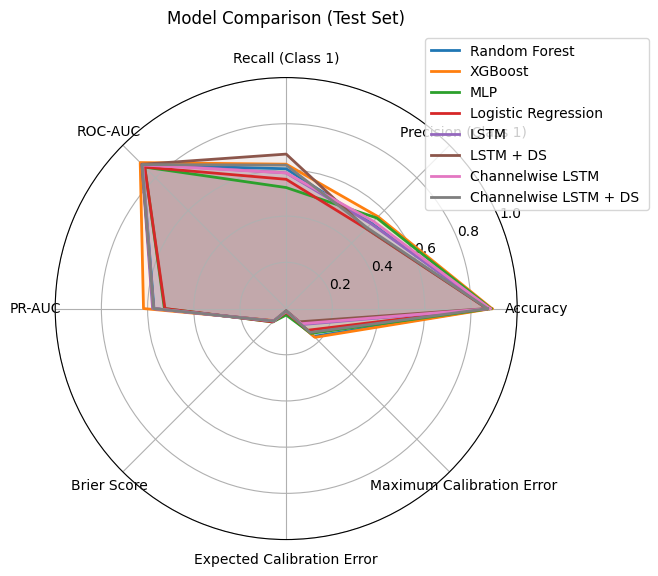

In [42]:
models = {
    "Random Forest": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/test_all.all.rf.json")),
    "XGBoost": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/test_all.all.xg.json")),
    "MLP": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/test_all.all.mlp.json")),
    "Logistic Regression": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/test_all.all.l2.C0.001.json")),
    "LSTM": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/test_lstm.json")),
    "LSTM + DS": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/test_lstm.json")),
    "Channelwise LSTM": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/test_channelwise_lstm.json")),
    "Channelwise LSTM + DS ": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/test_channelwise_lstm.json"))
    
}

plot_radar(models)

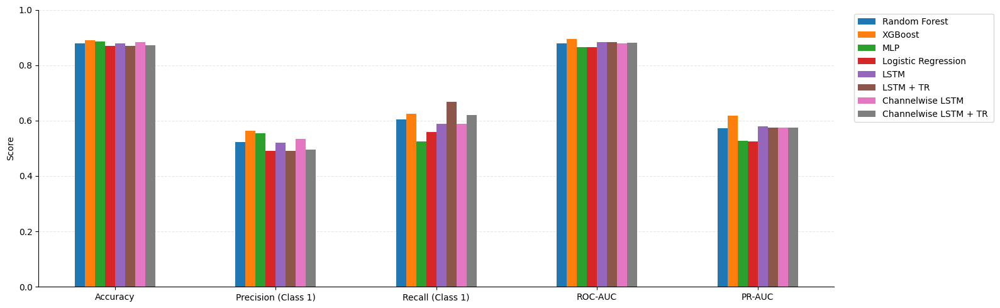

In [11]:
models = {
    "Random Forest": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/test_all.all.rf.json")),
    "XGBoost": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/test_all.all.xg.json")),
    "MLP": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/test_all.all.mlp.json")),
    "Logistic Regression": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/test_all.all.l2.C0.001.json")),
    "LSTM": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/test_lstm.json")),
    "LSTM + TR": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/test_lstm.json")),
    "Channelwise LSTM": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/test_channelwise_lstm.json")),
    "Channelwise LSTM + TR ": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/test_channelwise_lstm.json"))
}

plot_grouped_bar(models, metrics=["Accuracy", "Precision (Class 1)", "Recall (Class 1)", "ROC-AUC", "PR-AUC"])

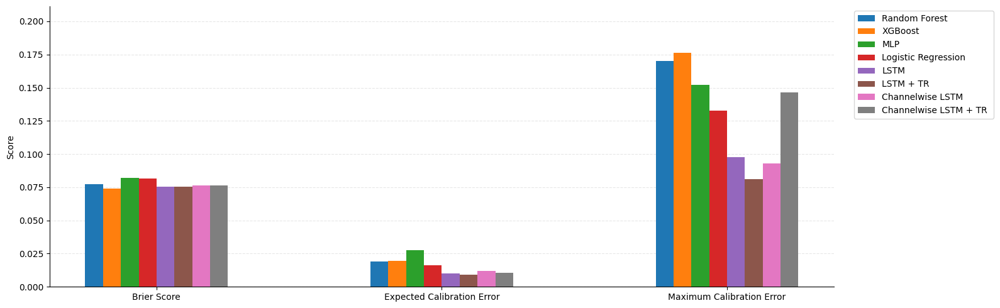

In [24]:
models = {
    "Random Forest": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/RandomForestTuned/results/test_all.all.rf.json")),
    "XGBoost": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/XGBoostTuned/results/test_all.all.xg.json")),
    "MLP": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/MLP/results/test_all.all.mlp.json")),
    "Logistic Regression": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/logistic/results/test_all.all.l2.C0.001.json")),
    "LSTM": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM/results/test_lstm.json")),
    "LSTM + TR": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/LSTM_DS/results/test_lstm.json")),
    "Channelwise LSTM": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM/results/test_channelwise_lstm.json")),
    "Channelwise LSTM + TR ": rename_metrics(load_test_metrics("C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/ChannelwiseLSTM_DS/results/test_channelwise_lstm.json"))
}

plot_grouped_bar(models, metrics=["Brier Score", "Expected Calibration Error", "Maximum Calibration Error"])

# Testing

## MICU Respiratory Failure

Namespace(period='all', features='all', data='C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/', output_dir='micu_results', severity='Minimal')
Reading test data and extracting features ...
MICU patients: 873
Total patients: 3968
Fraction: 0.22001008064516128
Mean oxygen saturation shift: -0.4205
Max  oxygen saturation shift: 2.9474
Mean fraction inspired oxygen shift: 0.0035
Max  fraction inspired oxygen shift: 0.0318
Mean heart rate shift: 0.0015
Max  heart rate shift: 0.8502
Mean respiratory rate shift: 0.0008
Max  respiratory rate shift: 0.5304

===== Minimal =====
Running XGBoost...
Running LogisticRegression...
Running Random Forest...
Running MLP...
Running deep model: LSTM...
==> not used params in network class: dict_keys([])
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Running deep model: LSTM_DS...
==> not used params in network class: dict_keys([])
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1

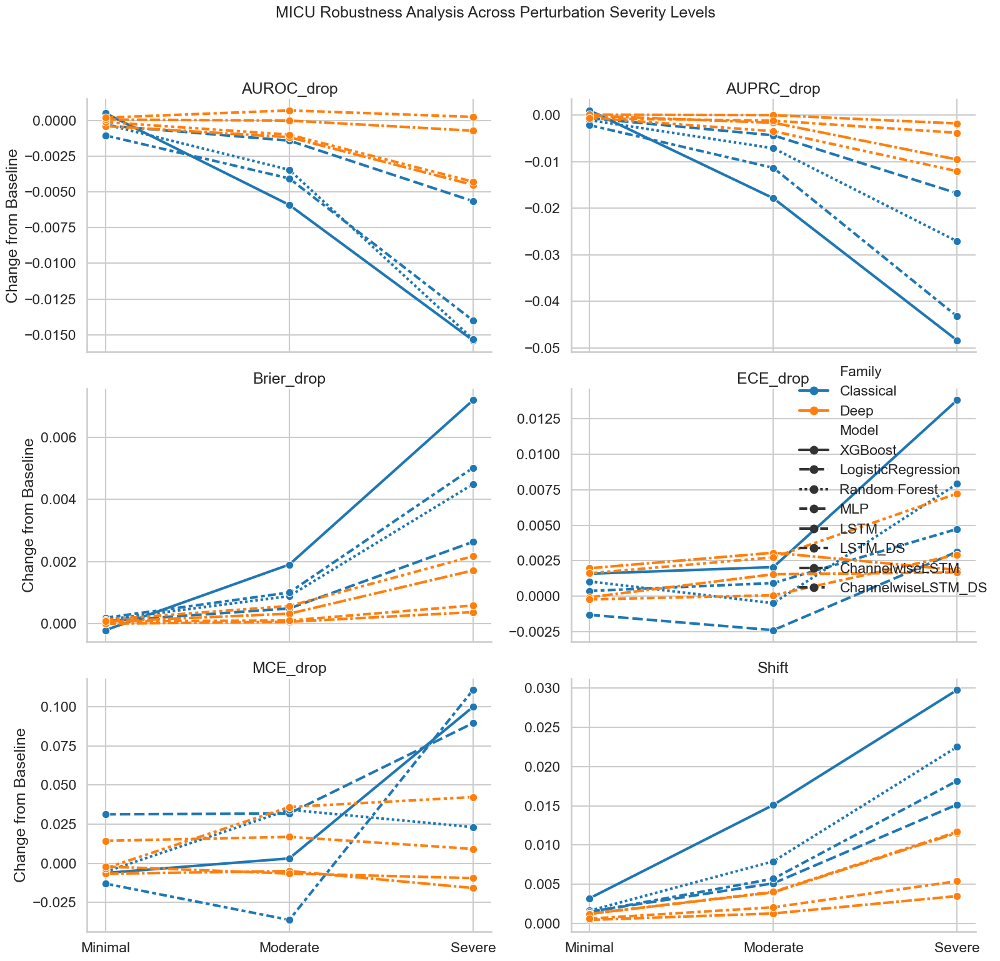

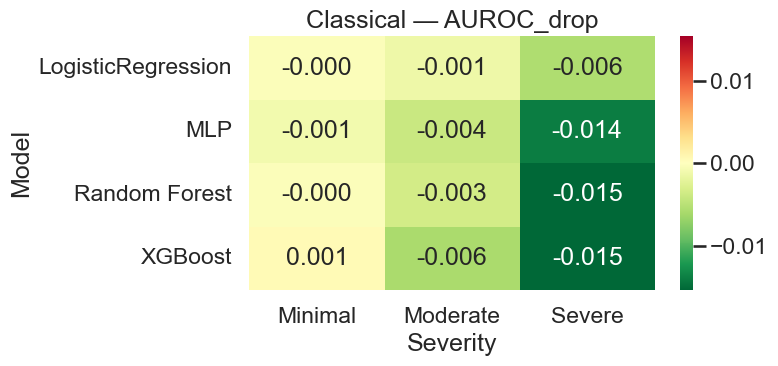

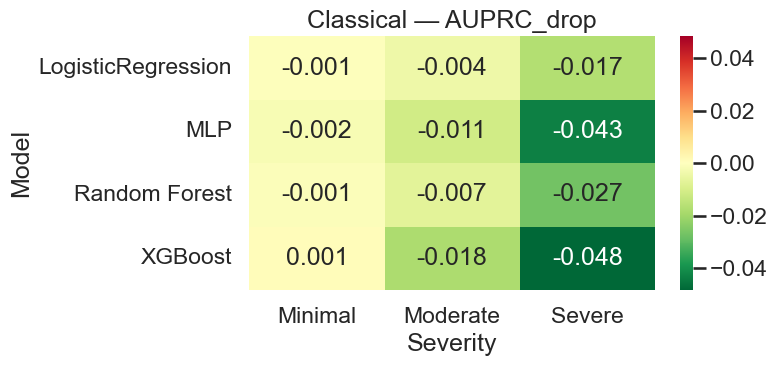

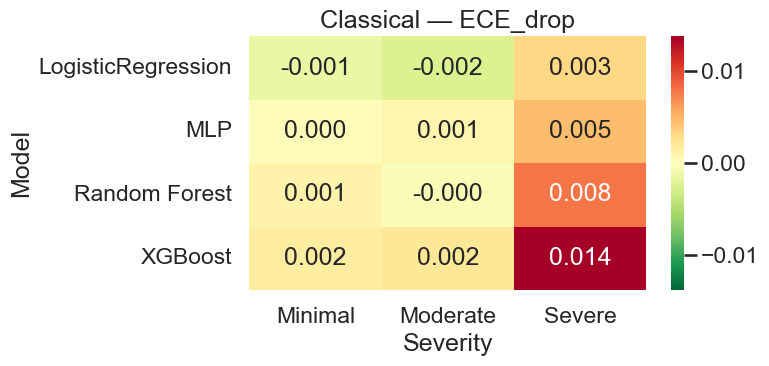

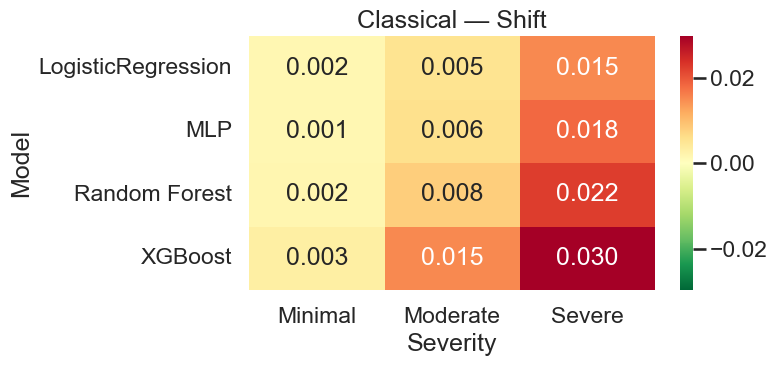

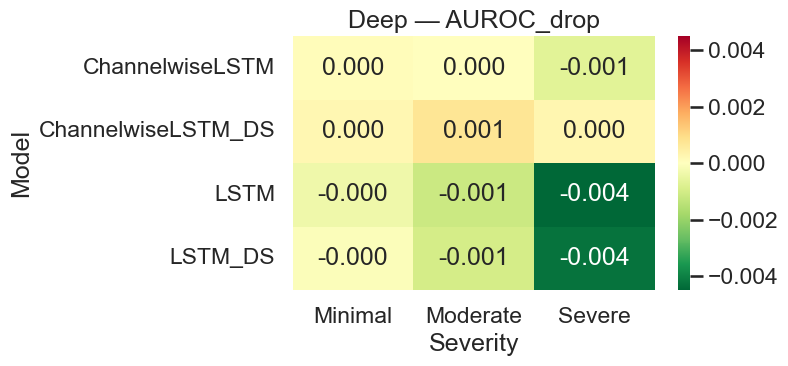

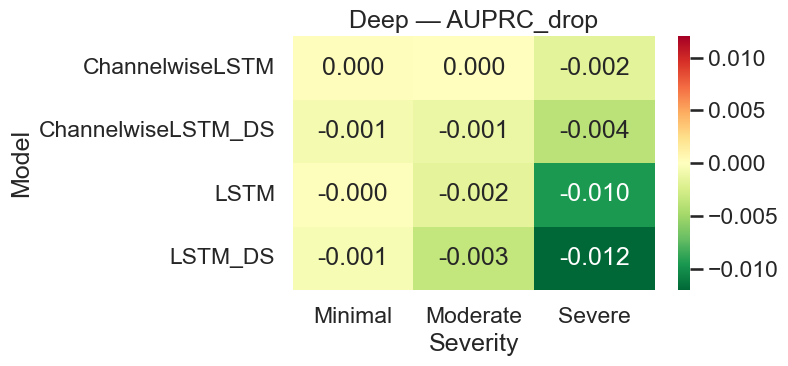

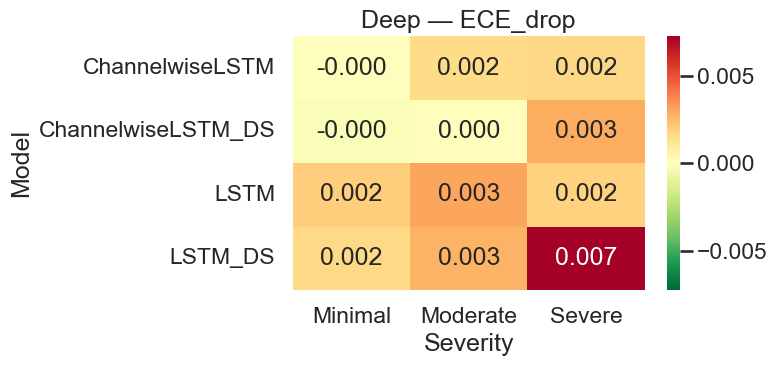

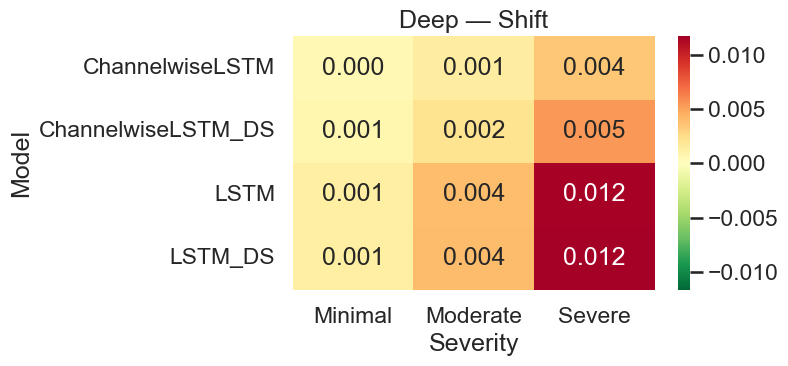

In [2]:
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
sys.path.append(r"C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/Testing/")

from MICU import main

severities = ["Minimal", "Moderate", "Severe"]

dfs = []

for sev in severities:
    df = main(
        return_df=True,
        cli_args=[
            "--period", "all",
            "--features", "all",
            "--data", r"C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/",
            "--output_dir", "micu_results",
            "--severity", sev
        ]
    )
    df["Severity"] = sev
    dfs.append(df)

final_df = pd.concat(dfs, ignore_index=True)

sns.set_theme(
    style="whitegrid",
    context="talk",
    palette="tab10"
)

plot_df = final_df.melt(
    id_vars=["Model", "Family", "Severity"],
    value_vars=[
        "AUROC_drop",
        "AUPRC_drop",
        "Brier_drop",
        "ECE_drop",
        "MCE_drop",
        "Shift"
    ],
    var_name="Metric",
    value_name="Value"
)

plot_df["Severity"] = pd.Categorical(
    plot_df["Severity"],
    categories=["Minimal", "Moderate", "Severe"],
    ordered=True
)

g = sns.relplot(
    data=plot_df,
    x="Severity",
    y="Value",
    hue="Family",
    style="Model",
    kind="line",
    marker="o",
    linewidth=3,
    estimator=None,
    col="Metric",
    col_wrap=2,
    height=5,
    aspect=1.3,
    facet_kws={"sharey": False}
)

g.set_titles("{col_name}")
g.set_axis_labels("", "Change from Baseline")

g.fig.suptitle(
    "MICU Robustness Analysis Across Perturbation Severity Levels",
    fontsize=18,
    y=1.03
)

plt.tight_layout()
plt.show()

# =========================
# OPTIONAL HEATMAPS
# =========================
families = final_df["Family"].unique()

metrics = ["AUROC_drop", "AUPRC_drop", "ECE_drop", "Shift"]

for family in families:

    family_df = final_df[final_df["Family"] == family]

    for metric in metrics:

        pivot = family_df.pivot(
            index="Model",
            columns="Severity",
            values=metric
        )

        vmax = np.abs(pivot.values).max()

        plt.figure(figsize=(8, 4))

        sns.heatmap(
            pivot,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn_r",
            center=0,
            vmin=-vmax,
            vmax=vmax
        )

        plt.title(f"{family} — {metric}")
        plt.tight_layout()
        plt.show()

## CCU Hypertension/Cardiac Instability

Namespace(period='all', features='all', data='C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/', output_dir='ccu_results', severity='Minimal')
Reading test data and extracting features ...
CCU patients: 480
Total patients: 3968
Fraction: 0.12096774193548387
Mean systolic blood pressure shift: 0.6041
Max  systolic blood pressure shift: 5.0000
Mean diastolic blood pressure shift: 0.6039
Max  diastolic blood pressure shift: 5.0000
Mean heart rate shift: 0.0001
Max  heart rate shift: 0.3455

===== Minimal =====
Running XGBoost...
Running LogisticRegression...
Running Random Forest...
Running MLP...
Running deep model: LSTM...
==> not used params in network class: dict_keys([])
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Running deep model: LSTM_DS...
==> not used params in network class: dict_keys([])
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Running deep model: ChannelwiseLSTM...
==> not used

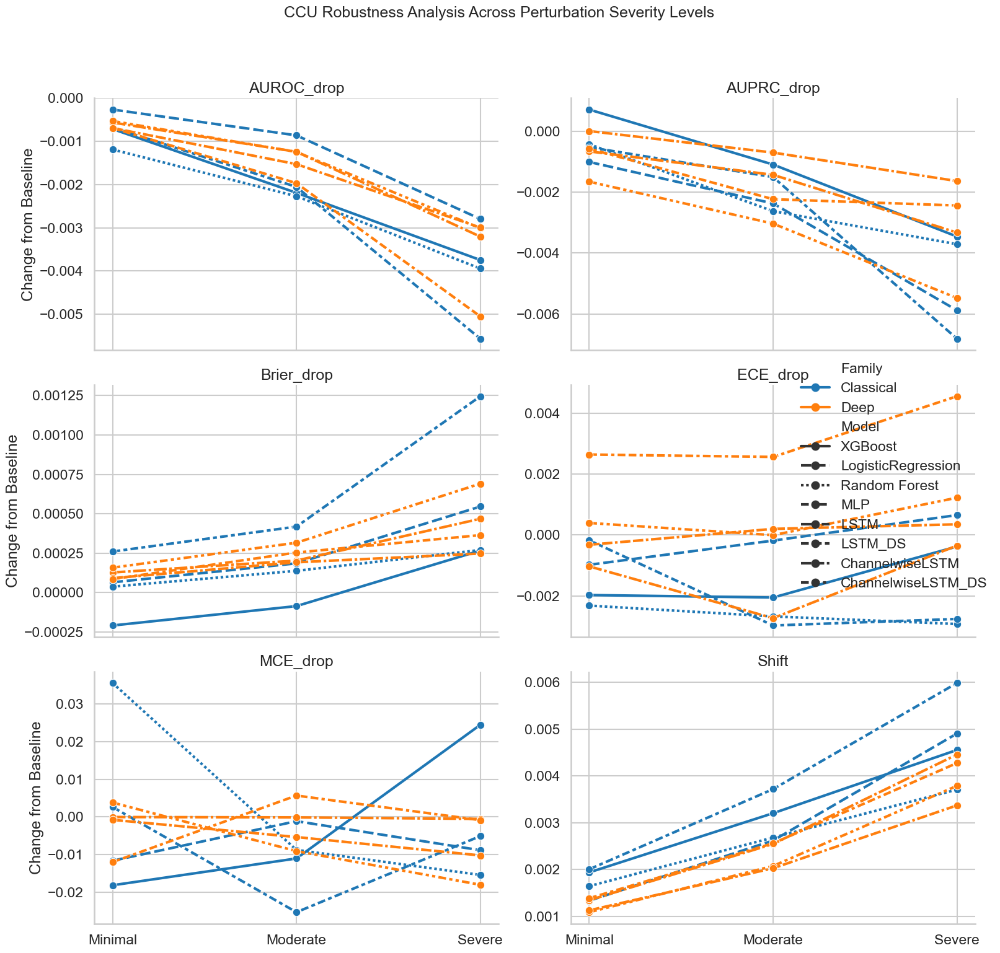

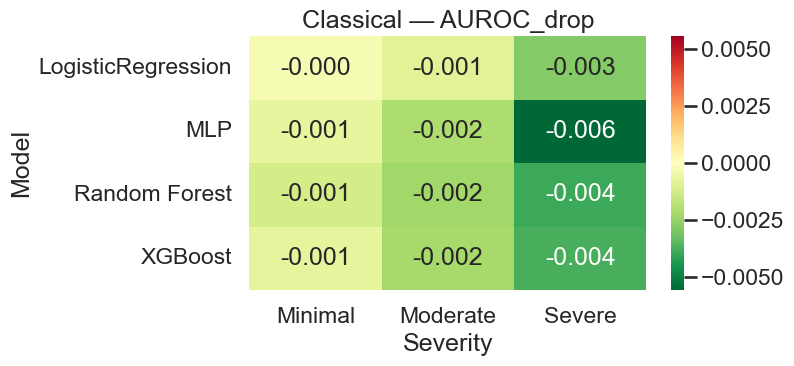

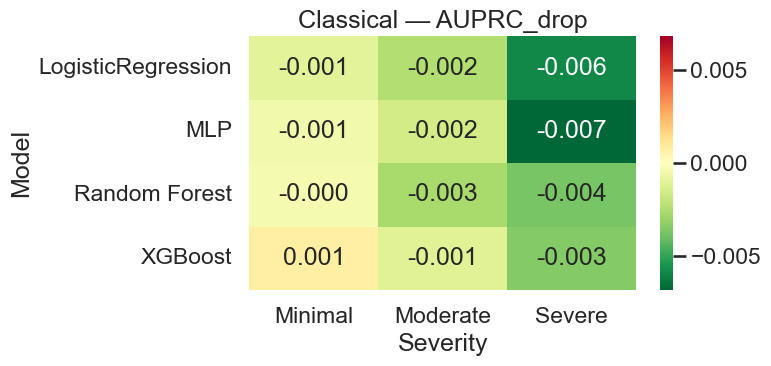

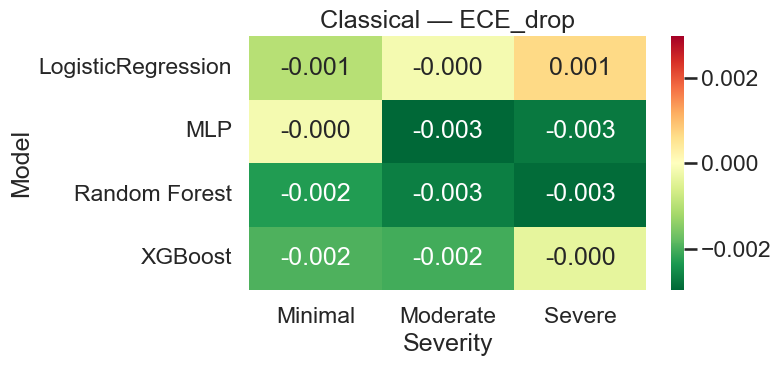

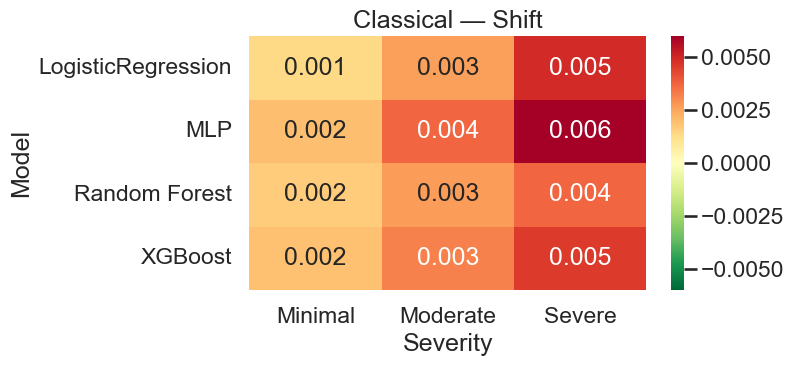

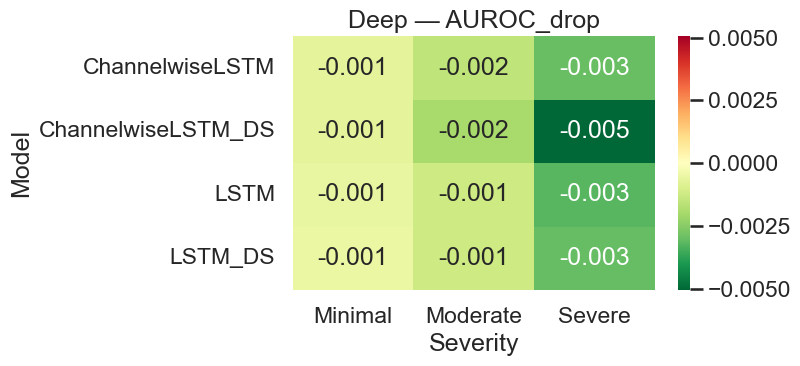

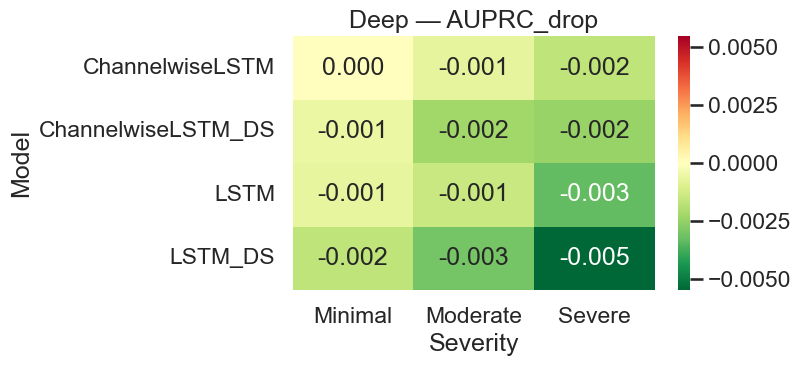

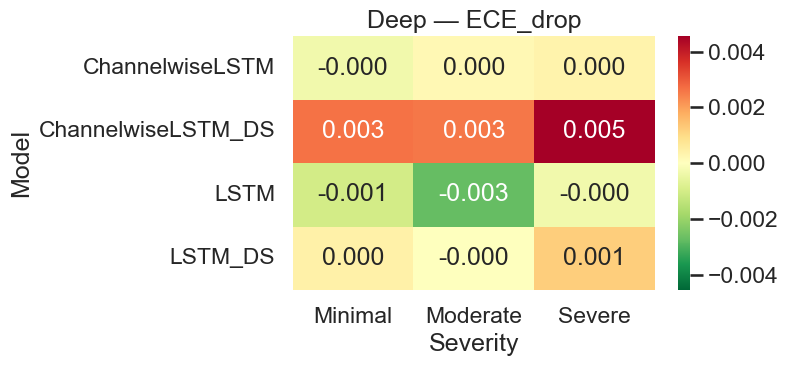

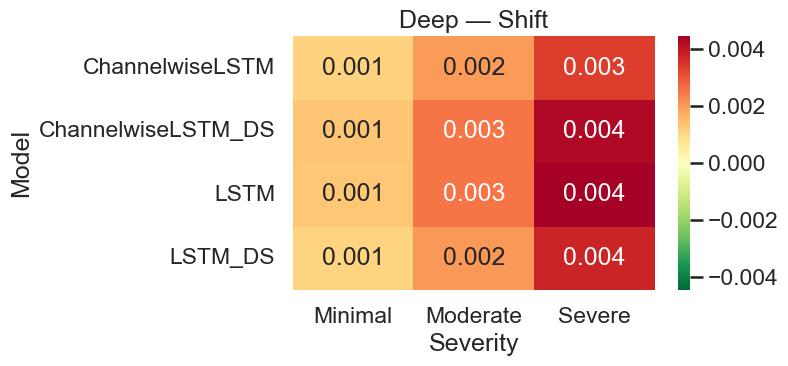

In [3]:
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
sys.path.append(r"C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/Testing/")

from CCU import main

severities = ["Minimal", "Moderate", "Severe"]

dfs = []

for sev in severities:
    df = main(
        return_df=True,
        cli_args=[
            "--period", "all",
            "--features", "all",
            "--data", r"C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/",
            "--output_dir", "ccu_results",
            "--severity", sev
        ]
    )
    df["Severity"] = sev
    dfs.append(df)

final_df = pd.concat(dfs, ignore_index=True)

sns.set_theme(
    style="whitegrid",
    context="talk",
    palette="tab10"
)

plot_df = final_df.melt(
    id_vars=["Model", "Family", "Severity"],
    value_vars=[
        "AUROC_drop",
        "AUPRC_drop",
        "Brier_drop",
        "ECE_drop",
        "MCE_drop",
        "Shift"
    ],
    var_name="Metric",
    value_name="Value"
)

plot_df["Severity"] = pd.Categorical(
    plot_df["Severity"],
    categories=["Minimal", "Moderate", "Severe"],
    ordered=True
)

g = sns.relplot(
    data=plot_df,
    x="Severity",
    y="Value",
    hue="Family",
    style="Model",
    kind="line",
    marker="o",
    linewidth=3,
    estimator=None,
    col="Metric",
    col_wrap=2,
    height=5,
    aspect=1.3,
    facet_kws={"sharey": False}
)

g.set_titles("{col_name}")
g.set_axis_labels("", "Change from Baseline")

g.fig.suptitle(
    "CCU Robustness Analysis Across Perturbation Severity Levels",
    fontsize=18,
    y=1.03
)

plt.tight_layout()
plt.show()

# =========================
# OPTIONAL HEATMAPS
# =========================
families = final_df["Family"].unique()

metrics = ["AUROC_drop", "AUPRC_drop", "ECE_drop", "Shift"]

for family in families:

    family_df = final_df[final_df["Family"] == family]

    for metric in metrics:

        pivot = family_df.pivot(
            index="Model",
            columns="Severity",
            values=metric
        )

        vmax = np.abs(pivot.values).max()

        plt.figure(figsize=(8, 4))

        sns.heatmap(
            pivot,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn_r",
            center=0,
            vmin=-vmax,
            vmax=vmax
        )

        plt.title(f"{family} — {metric}")
        plt.tight_layout()
        plt.show()

## CVICU Cardiac Surgery Recovery

Namespace(period='all', features='all', data='C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/', output_dir='cvicu_results', severity='Minimal')
Reading test data and extracting features ...
CVICU patients: 626
Total patients: 3968
Fraction: 0.15776209677419356
Mean heart rate shift: 0.6395
Max  heart rate shift: 6.3933
Mean temperature shift: 0.0292
Max  temperature shift: 0.2000
Mean hemoglobin shift: -0.0793
Max  hemoglobin shift: 0.8150
Mean hematocrit shift: -0.2387
Max  hematocrit shift: 2.3750
Mean lactate shift: 0.0000
Max  lactate shift: 0.0000

===== Minimal =====
Running XGBoost...
Running LogisticRegression...
Running Random Forest...
Running MLP...
Running deep model: LSTM...
==> not used params in network class: dict_keys([])
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Running deep model: LSTM_DS...
==> not used params in network class: dict_keys([])
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
124/124 ━━━━━━━━━━━━━━━━━

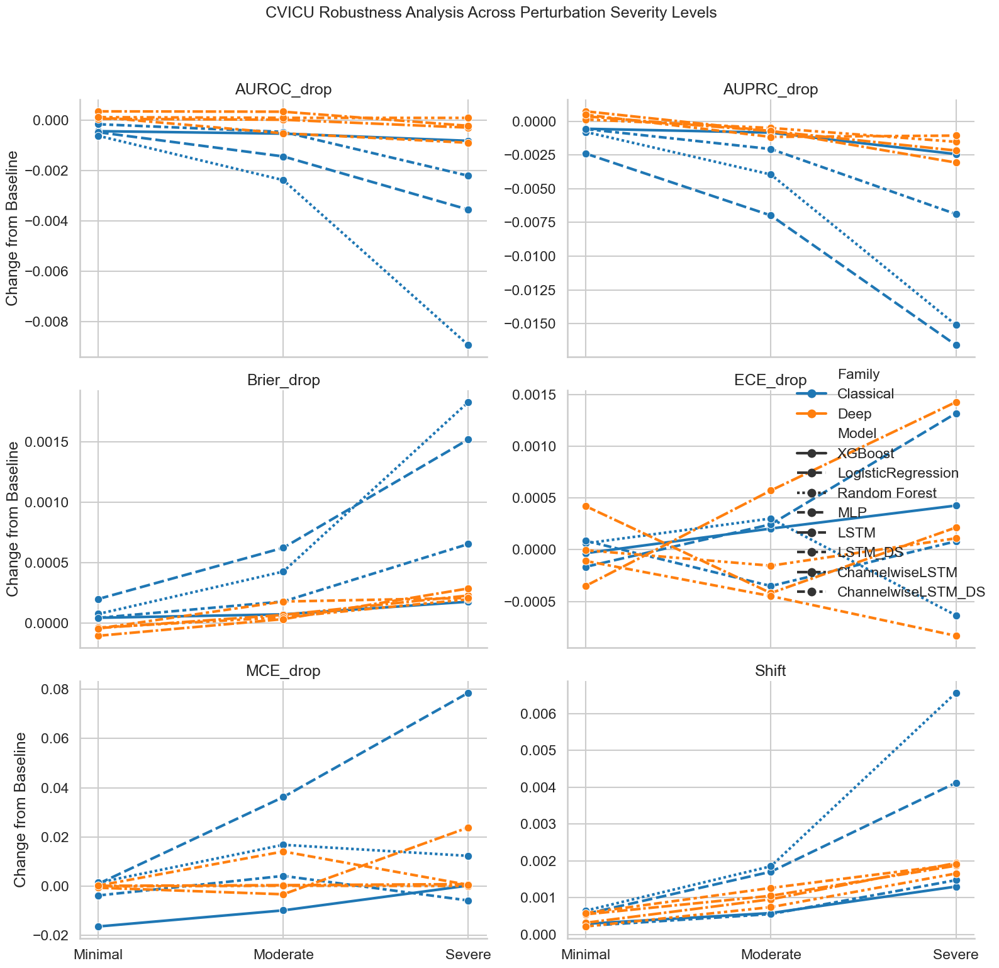

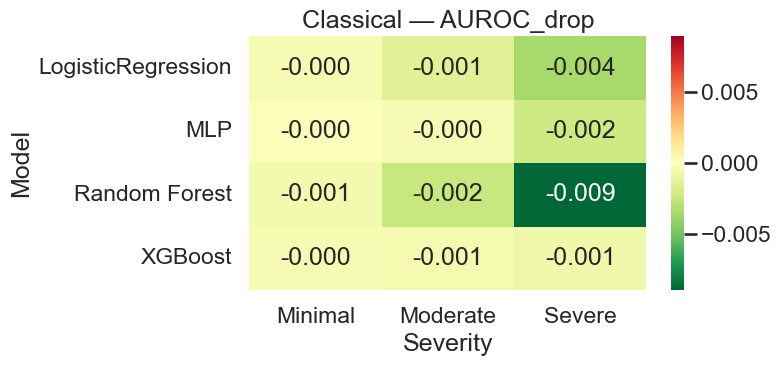

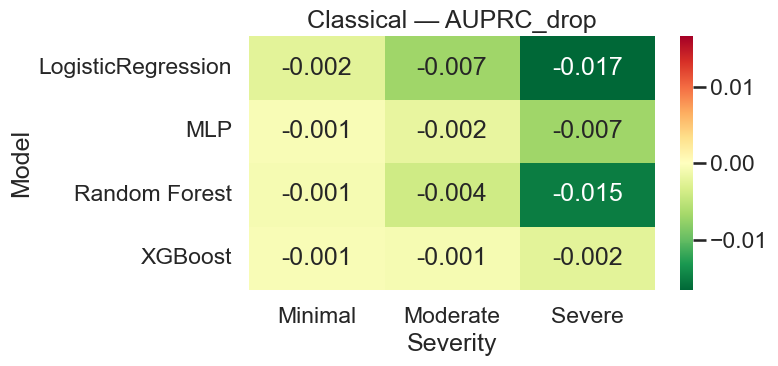

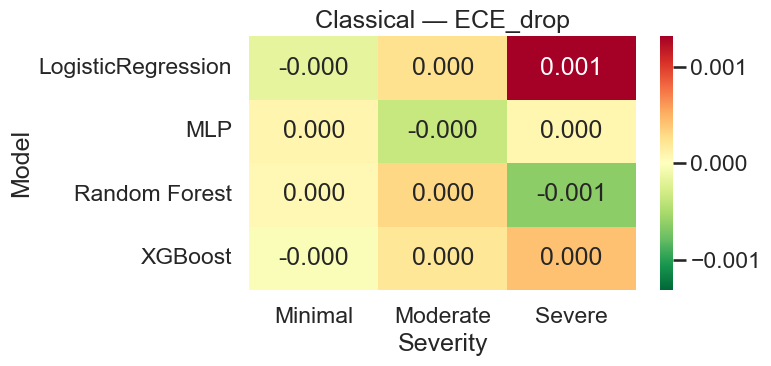

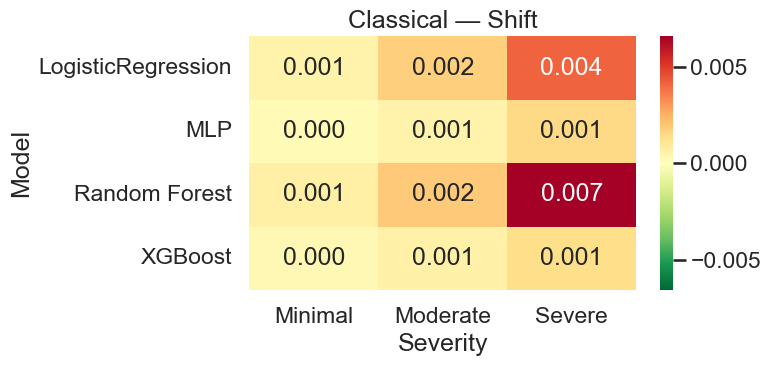

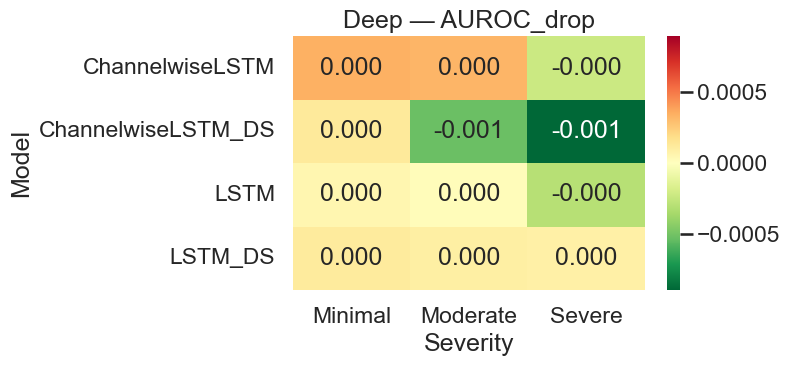

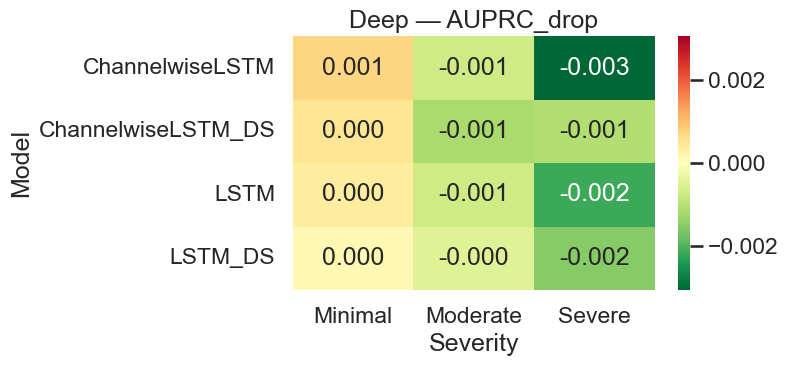

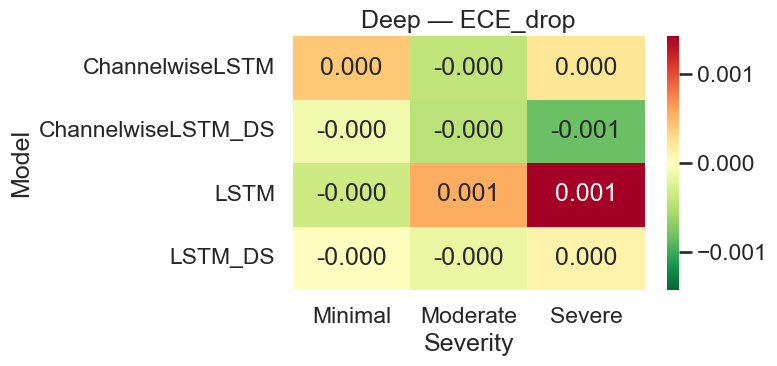

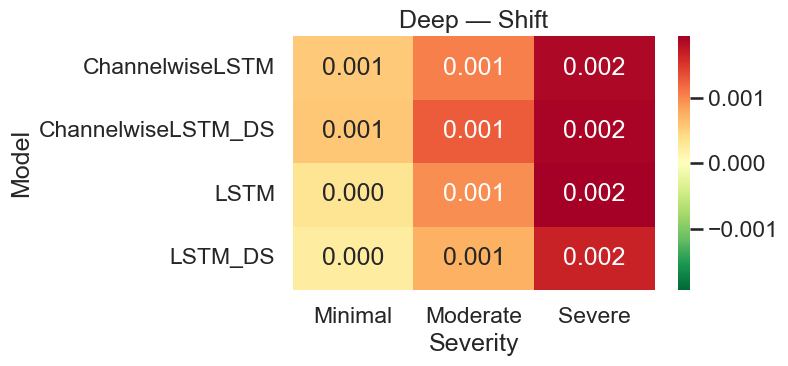

In [2]:
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
heatmap_dir = os.path.join("C:/Users/chris/Thesis/mimic4-benchmarks/cvicu_results/", "heatmaps")
os.makedirs(heatmap_dir, exist_ok=True)
sys.path.append(r"C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/Testing/")

from CVICU import main

severities = ["Minimal", "Moderate", "Severe"]

dfs = []

for sev in severities:
    df = main(
        return_df=True,
        cli_args=[
            "--period", "all",
            "--features", "all",
            "--data", r"C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/",
            "--output_dir", "cvicu_results",
            "--severity", sev
        ]
    )
    df["Severity"] = sev
    dfs.append(df)

final_df = pd.concat(dfs, ignore_index=True)

sns.set_theme(
    style="whitegrid",
    context="talk",
    palette="tab10"
)

plot_df = final_df.melt(
    id_vars=["Model", "Family", "Severity"],
    value_vars=[
        "AUROC_drop",
        "AUPRC_drop",
        "Brier_drop",
        "ECE_drop",
        "MCE_drop",
        "Shift"
    ],
    var_name="Metric",
    value_name="Value"
)

plot_df["Severity"] = pd.Categorical(
    plot_df["Severity"],
    categories=["Minimal", "Moderate", "Severe"],
    ordered=True
)

g = sns.relplot(
    data=plot_df,
    x="Severity",
    y="Value",
    hue="Family",
    style="Model",
    kind="line",
    marker="o",
    linewidth=3,
    estimator=None,
    col="Metric",
    col_wrap=2,
    height=5,
    aspect=1.3,
    facet_kws={"sharey": False}
)

g.set_titles("{col_name}")
g.set_axis_labels("", "Change from Baseline")

g.fig.suptitle(
    "CVICU Robustness Analysis Across Perturbation Severity Levels",
    fontsize=18,
    y=1.03
)

plt.tight_layout()
plt.show()

# =========================
# OPTIONAL HEATMAPS
# =========================
families = final_df["Family"].unique()

metrics = ["AUROC_drop", "AUPRC_drop", "ECE_drop", "Shift"]

for family in families:

    family_df = final_df[final_df["Family"] == family]

    for metric in metrics:

        pivot = family_df.pivot(
            index="Model",
            columns="Severity",
            values=metric
        )

        vmax = np.abs(pivot.values).max()

        plt.figure(figsize=(8, 4))

        sns.heatmap(
            pivot,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn_r",
            center=0,
            vmin=-vmax,
            vmax=vmax
        )

        plt.title(f"{family} — {metric}")
        plt.tight_layout()
        filename = f"{family}_{metric}.png".replace(" ", "_")
        plt.savefig(
            os.path.join(heatmap_dir, filename),
            dpi=300,
            bbox_inches="tight"
        )
        plt.show()

## MICU/SICU Acute Kidney Injury

Namespace(period='all', features='all', data='C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/', output_dir='micu_sicu_results', severity='Minimal')
Reading test data and extracting features ...
MICU/SICU patients: 683
Total patients: 3968
Fraction: 0.17212701612903225
Mean creatinine shift: 0.0380
Max  creatinine shift: 1.9622
Mean potassium shift: 0.0170
Max  potassium shift: 0.2731
Mean sodium shift: -0.0145
Max  sodium shift: 2.8597
Mean heart rate shift: 0.6947
Max  heart rate shift: 4.9994
Mean respiratory rate shift: 0.3422
Max  respiratory rate shift: 2.9967
Mean mean blood pressure shift: -0.4698
Max  mean blood pressure shift: 4.9510
Mean systolic blood pressure shift: 0.0000
Max  systolic blood pressure shift: 0.0000
Mean lactate shift: 0.0000
Max  lactate shift: 0.0000
Mean oxygen saturation shift: 0.0000
Max  oxygen saturation shift: 0.0000

===== Minimal =====
Running XGBoost...
Running LogisticRegression...
Running Random Forest...
Running MLP...
Runni

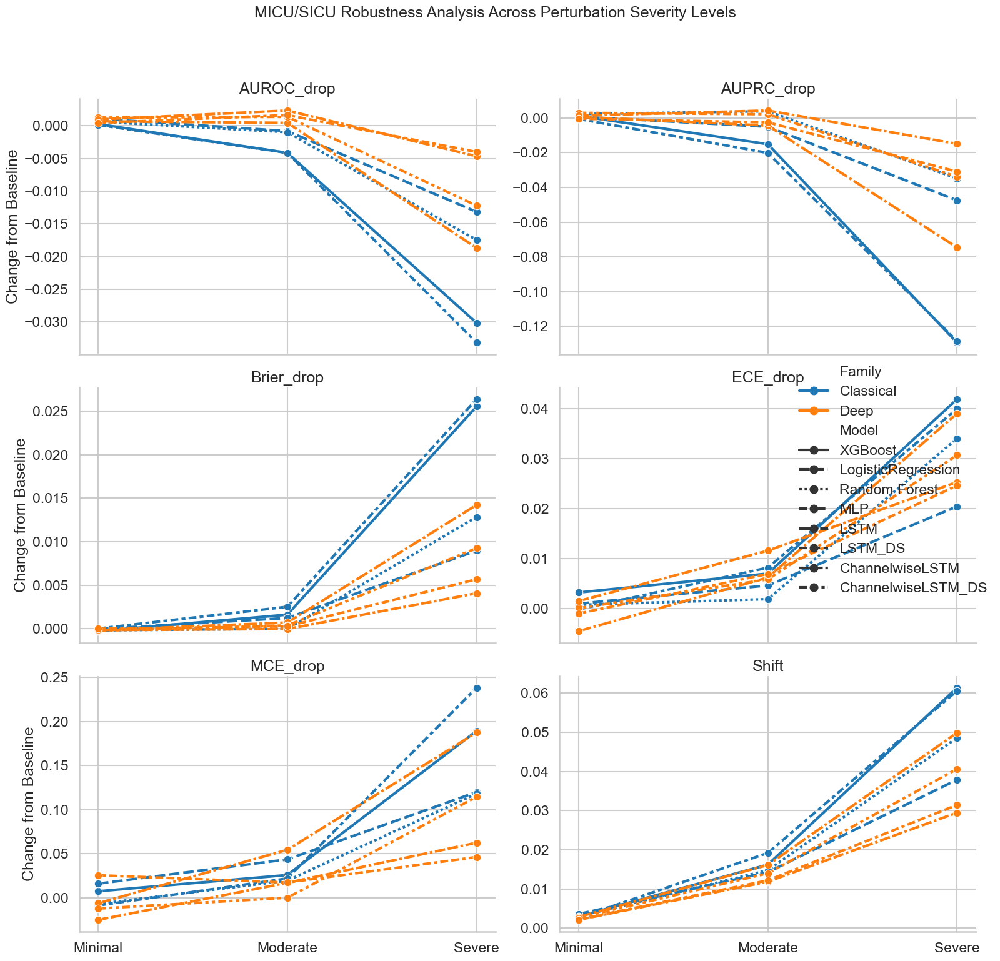

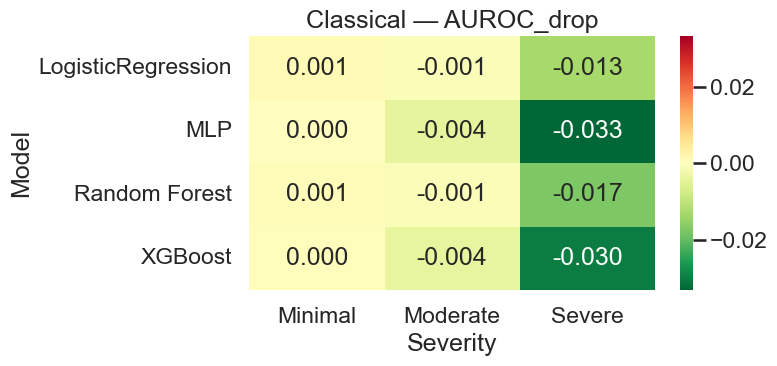

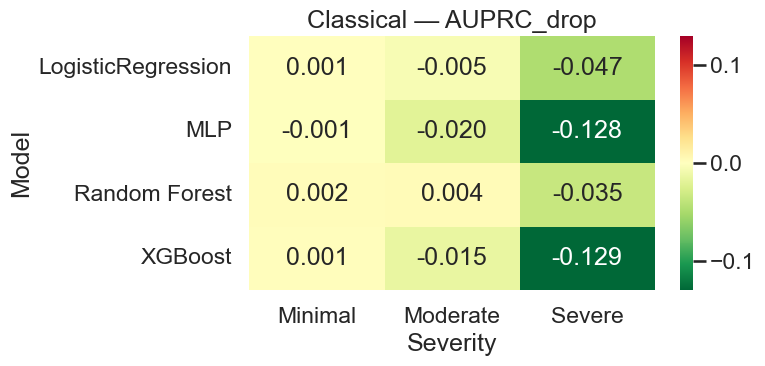

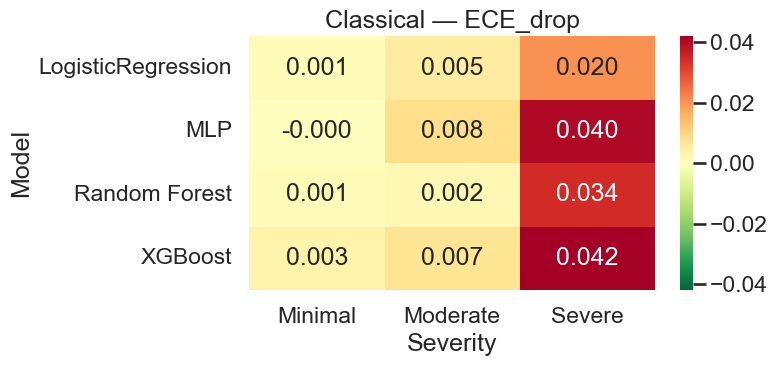

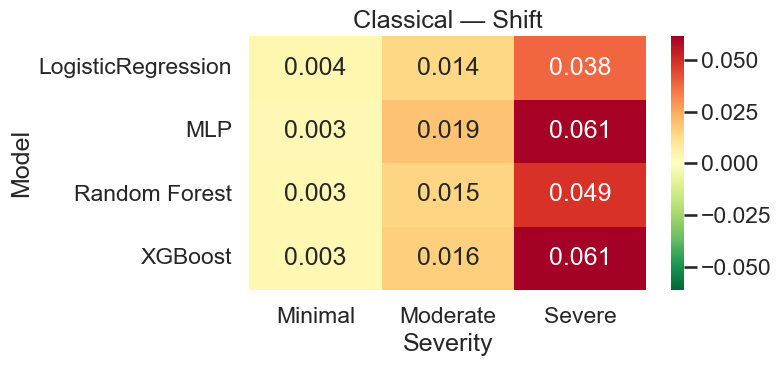

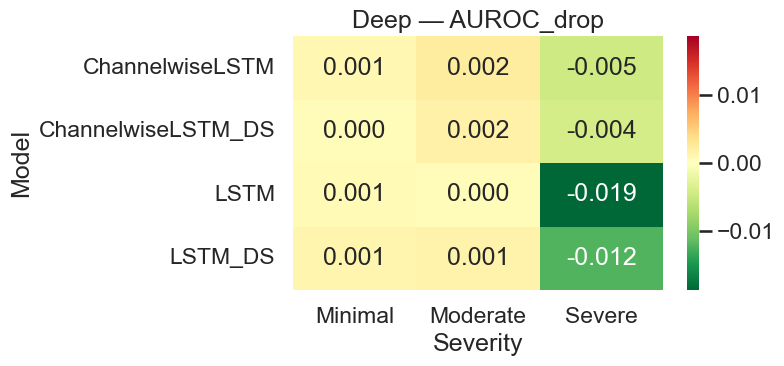

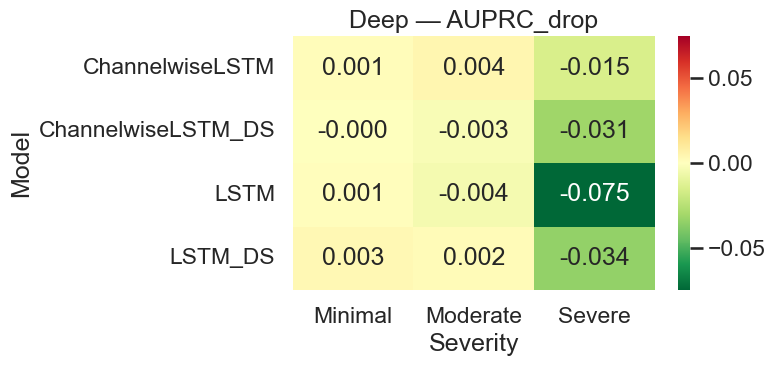

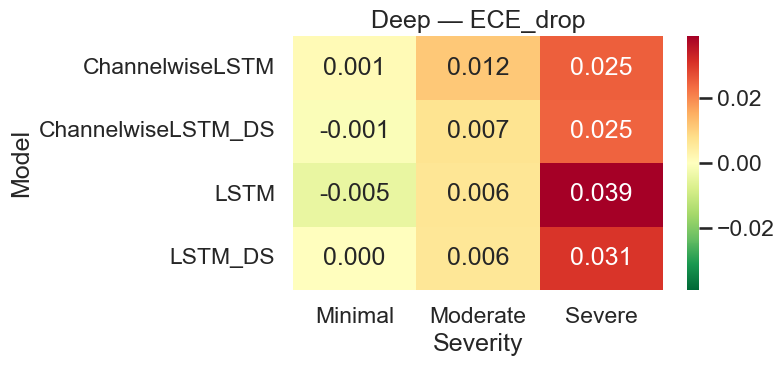

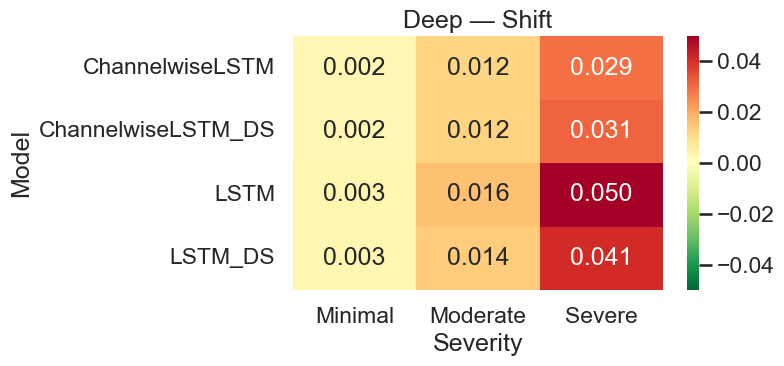

In [3]:
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
heatmap_dir = os.path.join("C:/Users/chris/Thesis/mimic4-benchmarks/micu_sicu_results/", "heatmaps")
os.makedirs(heatmap_dir, exist_ok=True)
sys.path.append(r"C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/Testing/")

from MICU_SICU import main

severities = ["Minimal", "Moderate", "Severe"]

dfs = []

for sev in severities:
    df = main(
        return_df=True,
        cli_args=[
            "--period", "all",
            "--features", "all",
            "--data", r"C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/",
            "--output_dir", "micu_sicu_results",
            "--severity", sev
        ]
    )
    df["Severity"] = sev
    dfs.append(df)

final_df = pd.concat(dfs, ignore_index=True)

sns.set_theme(
    style="whitegrid",
    context="talk",
    palette="tab10"
)

plot_df = final_df.melt(
    id_vars=["Model", "Family", "Severity"],
    value_vars=[
        "AUROC_drop",
        "AUPRC_drop",
        "Brier_drop",
        "ECE_drop",
        "MCE_drop",
        "Shift"
    ],
    var_name="Metric",
    value_name="Value"
)

plot_df["Severity"] = pd.Categorical(
    plot_df["Severity"],
    categories=["Minimal", "Moderate", "Severe"],
    ordered=True
)

g = sns.relplot(
    data=plot_df,
    x="Severity",
    y="Value",
    hue="Family",
    style="Model",
    kind="line",
    marker="o",
    linewidth=3,
    estimator=None,
    col="Metric",
    col_wrap=2,
    height=5,
    aspect=1.3,
    facet_kws={"sharey": False}
)

g.set_titles("{col_name}")
g.set_axis_labels("", "Change from Baseline")

g.fig.suptitle(
    "MICU/SICU Robustness Analysis Across Perturbation Severity Levels",
    fontsize=18,
    y=1.03
)

plt.tight_layout()
plt.show()

# =========================
# OPTIONAL HEATMAPS
# =========================
families = final_df["Family"].unique()

metrics = ["AUROC_drop", "AUPRC_drop", "ECE_drop", "Shift"]

for family in families:

    family_df = final_df[final_df["Family"] == family]

    for metric in metrics:

        pivot = family_df.pivot(
            index="Model",
            columns="Severity",
            values=metric
        )

        vmax = np.abs(pivot.values).max()

        plt.figure(figsize=(8, 4))

        sns.heatmap(
            pivot,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn_r",
            center=0,
            vmin=-vmax,
            vmax=vmax
        )

        plt.title(f"{family} — {metric}")
        plt.tight_layout()
        filename = f"{family}_{metric}.png".replace(" ", "_")
        plt.savefig(
            os.path.join(heatmap_dir, filename),
            dpi=300,
            bbox_inches="tight"
        )
        plt.show()

## SICU Post-operative Inflammation

Namespace(period='all', features='all', data='C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/', output_dir='sicu_results', severity='Minimal')
Reading test data and extracting features ...
SICU patients: 573
Total patients: 3968
Fraction: 0.14440524193548387
Mean heart rate shift: 0.6111
Max  heart rate shift: 6.2963
Mean temperature shift: 0.0440
Max  temperature shift: 0.3000
Mean hemoglobin shift: -0.0781
Max  hemoglobin shift: 0.9183
Mean hematocrit shift: -0.2343
Max  hematocrit shift: 2.7767
Mean lactate shift: 0.0000
Max  lactate shift: 0.0000
Mean white blood cell count shift: 0.2537
Max  white blood cell count shift: 10.1250
Mean fraction inspired oxygen shift: 0.0000
Max  fraction inspired oxygen shift: 0.0000
Mean creatinine shift: 0.0000
Max  creatinine shift: 0.0000

===== Minimal =====
Running XGBoost...
Running LogisticRegression...
Running Random Forest...
Running MLP...
Running deep model: LSTM...
==> not used params in network class: dict_keys([])


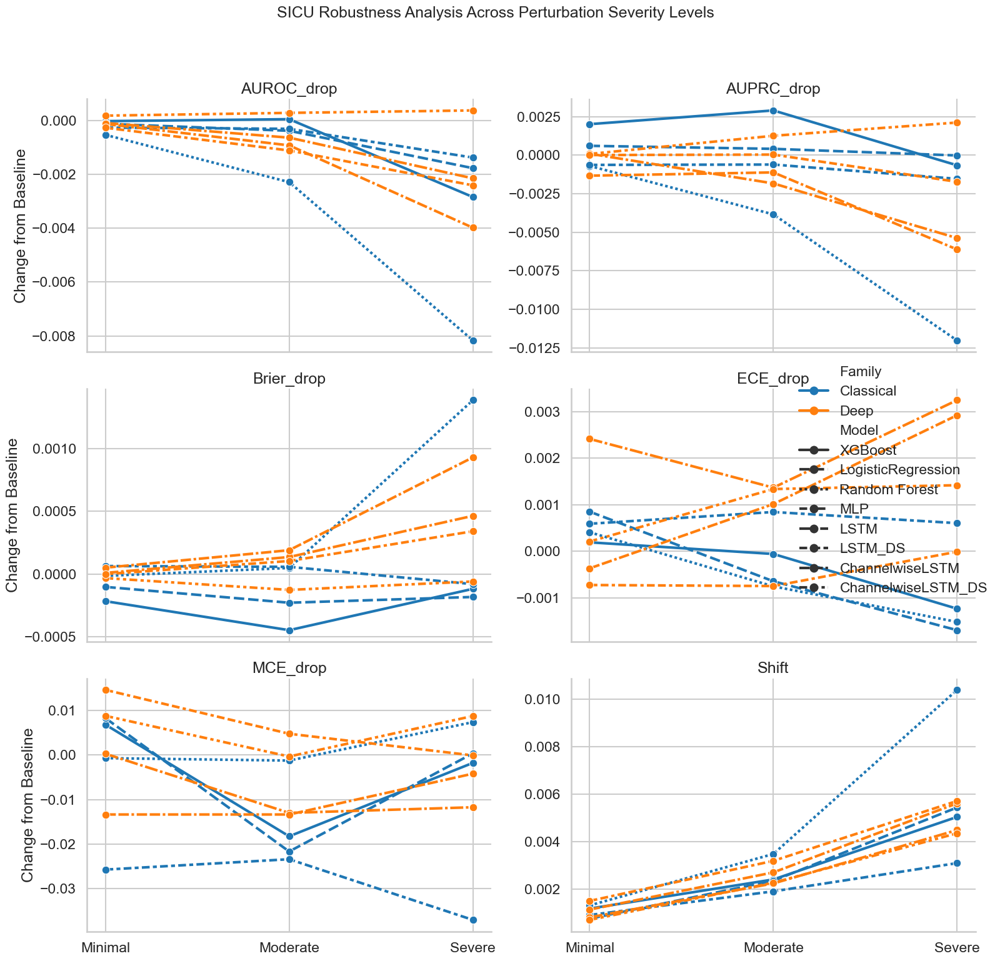

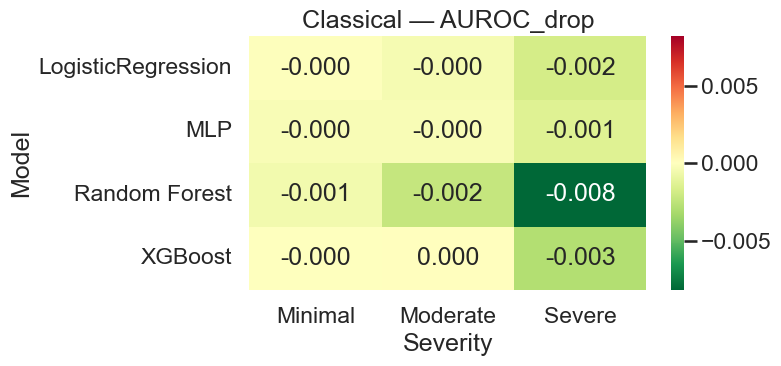

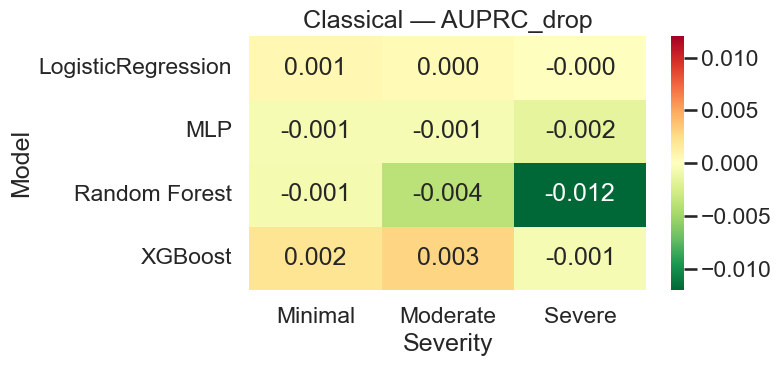

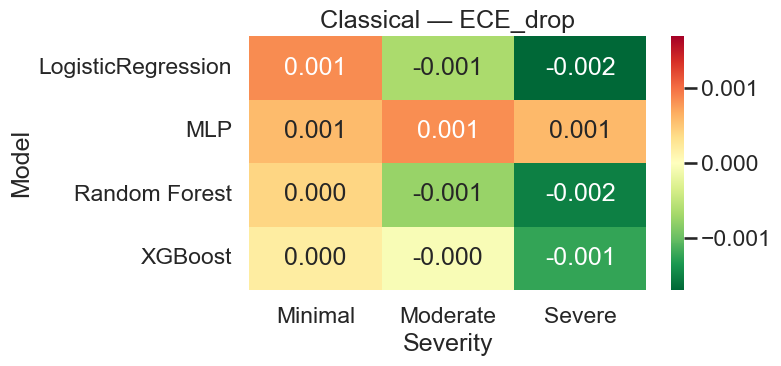

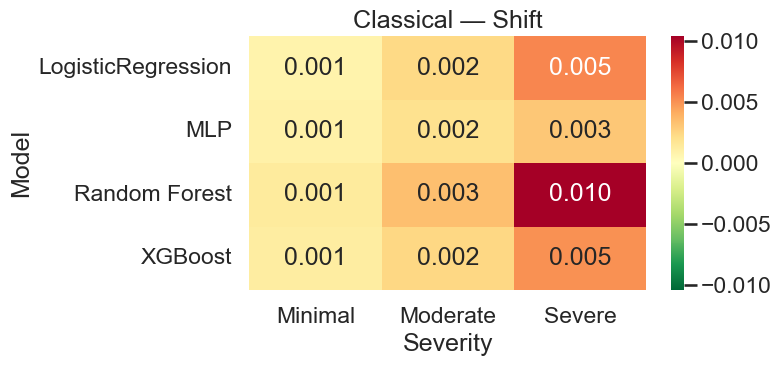

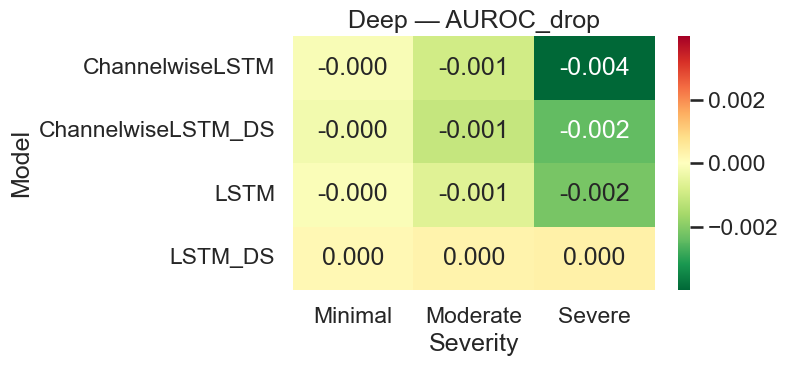

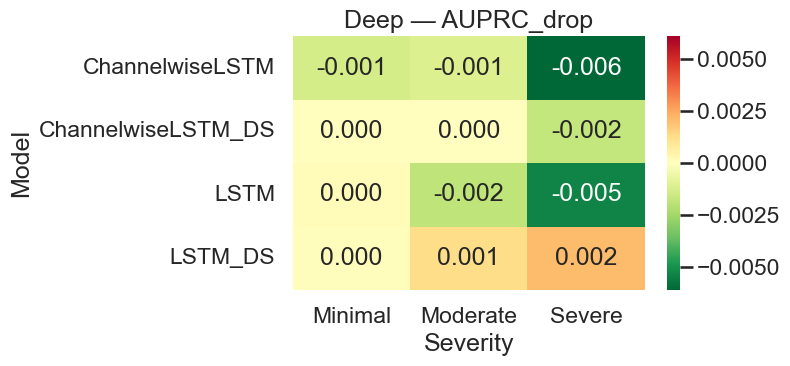

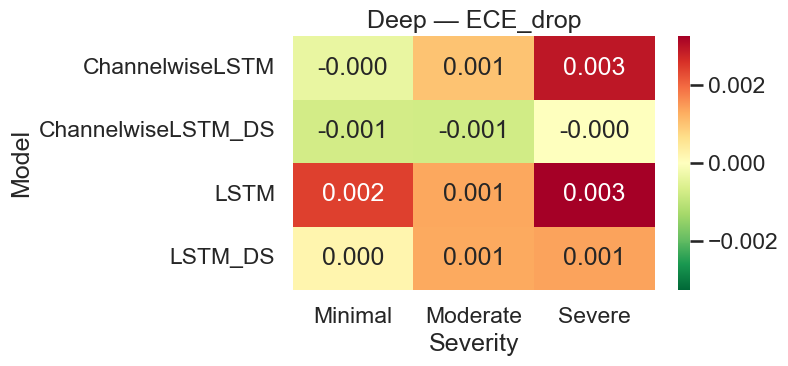

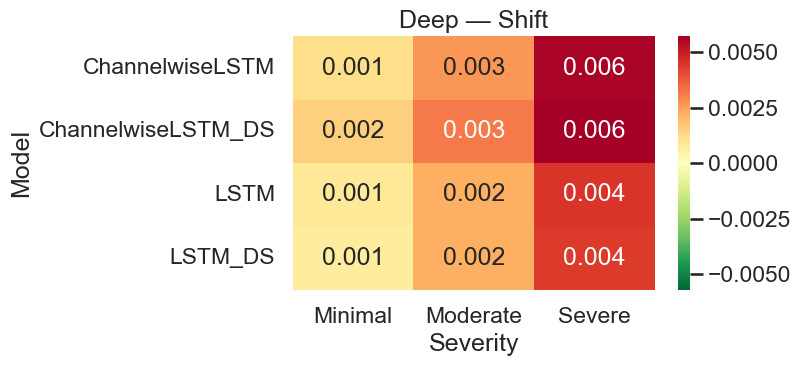

In [2]:
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
heatmap_dir = os.path.join("C:/Users/chris/Thesis/mimic4-benchmarks/sicu_results/", "heatmaps")
os.makedirs(heatmap_dir, exist_ok=True)
sys.path.append(r"C:/Users/chris/Thesis/mimic4-benchmarks/mimic4models/in_hospital_mortality/Testing/")

from SICU import main

severities = ["Minimal", "Moderate", "Severe"]

dfs = []

for sev in severities:
    df = main(
        return_df=True,
        cli_args=[
            "--period", "all",
            "--features", "all",
            "--data", r"C:/Users/chris/Thesis/mimic4-benchmarks/data/in-hospital-mortality/",
            "--output_dir", "sicu_results",
            "--severity", sev
        ]
    )
    df["Severity"] = sev
    dfs.append(df)

final_df = pd.concat(dfs, ignore_index=True)

sns.set_theme(
    style="whitegrid",
    context="talk",
    palette="tab10"
)

plot_df = final_df.melt(
    id_vars=["Model", "Family", "Severity"],
    value_vars=[
        "AUROC_drop",
        "AUPRC_drop",
        "Brier_drop",
        "ECE_drop",
        "MCE_drop",
        "Shift"
    ],
    var_name="Metric",
    value_name="Value"
)

plot_df["Severity"] = pd.Categorical(
    plot_df["Severity"],
    categories=["Minimal", "Moderate", "Severe"],
    ordered=True
)

g = sns.relplot(
    data=plot_df,
    x="Severity",
    y="Value",
    hue="Family",
    style="Model",
    kind="line",
    marker="o",
    linewidth=3,
    estimator=None,
    col="Metric",
    col_wrap=2,
    height=5,
    aspect=1.3,
    facet_kws={"sharey": False}
)

g.set_titles("{col_name}")
g.set_axis_labels("", "Change from Baseline")

g.fig.suptitle(
    "SICU Robustness Analysis Across Perturbation Severity Levels",
    fontsize=18,
    y=1.03
)

plt.tight_layout()
plt.show()

# =========================
# OPTIONAL HEATMAPS
# =========================
families = final_df["Family"].unique()

metrics = ["AUROC_drop", "AUPRC_drop", "ECE_drop", "Shift"]

for family in families:

    family_df = final_df[final_df["Family"] == family]

    for metric in metrics:

        pivot = family_df.pivot(
            index="Model",
            columns="Severity",
            values=metric
        )

        vmax = np.abs(pivot.values).max()

        plt.figure(figsize=(8, 4))

        sns.heatmap(
            pivot,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn_r",
            center=0,
            vmin=-vmax,
            vmax=vmax
        )

        plt.title(f"{family} — {metric}")
        plt.tight_layout()
        filename = f"{family}_{metric}.png".replace(" ", "_")
        plt.savefig(
            os.path.join(heatmap_dir, filename),
            dpi=300,
            bbox_inches="tight"
        )
        plt.show()